In [1]:
# reload packages
%load_ext autoreload
%autoreload 2

### Choose GPU

In [2]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=0


In [3]:
import tensorflow as tf
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
if len(gpu_devices)>0:
    tf.config.experimental.set_memory_growth(gpu_devices[0], True)
print(gpu_devices)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
tf.keras.backend.clear_session()

### dataset information

In [5]:
from datetime import datetime
dataset = 'fmnist'
dims = (28,28,1)
umap_prop = 1.0
num_classes = 10
PROJECTION_DIMS = 2
labels_per_class = 'full'
datestring = datetime.now().strftime("%Y_%m_%d_%H_%M_%S_%f")
print(datestring)

2020_07_29_14_02_18_977719


### Load packages

In [6]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
from IPython import display
import pandas as pd
import umap
import copy
import os, tempfile

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


### Load dataset

In [7]:
from tfumap.load_datasets import load_FMNIST, mask_labels

In [8]:
X_train, X_test, X_valid, Y_train, Y_test, Y_valid = load_FMNIST(flatten=False)
X_train.shape

(50000, 28, 28, 1)

In [9]:
if labels_per_class == "full":
    X_labeled = X_train
    Y_labeled = Y_train
    Y_masked = np.ones(len(Y_train))
else:
    X_labeled, Y_labeled, Y_masked = mask_labels(
        X_train, Y_train, labels_per_class=labels_per_class
    )

### Build umap graph

In [10]:
from tfumap.semisupervised import build_fuzzy_simplicial_set

In [11]:
Y_masked2 = copy.deepcopy(Y_train)
Y_masked2[Y_masked!=1] = -1

In [12]:
n_neighbors = 15  # default = 15
umap_graph = build_fuzzy_simplicial_set(
    X_train.reshape((len(X_train), np.product(np.shape(X_train)[1:]))),
    y=Y_masked2,
    n_neighbors=n_neighbors,
)

### Build data iterators

In [13]:
from tfumap.umap import compute_cross_entropy, get_graph_elements
from tfumap.semisupervised import create_edge_iterator, create_validation_iterator, create_classification_iterator

In [14]:
n_epochs = 200
graph, epochs_per_sample, head, tail, weight, n_vertices = get_graph_elements(
            umap_graph, n_epochs
)
batch_size = np.min([n_vertices, 1000])
batch_size

1000

In [15]:
# make sure batch size is no bigger than the number of labels per class
labeled_batch_size = batch_size if batch_size < len(Y_labeled) else len(Y_labeled)
labeled_iter = create_classification_iterator(X_labeled, Y_labeled, batch_size=batch_size)
print(labeled_batch_size)

1000


In [16]:
max_sample_repeats_per_epoch = 25
edge_iter, n_edges_per_epoch = create_edge_iterator(
    head,
    tail,
    weight,
    batch_size=batch_size,
    max_sample_repeats_per_epoch=max_sample_repeats_per_epoch,
)

In [17]:
data_valid, n_valid_samp = create_validation_iterator(X_valid, Y_valid, batch_size, repeat=True)

### Build network

In [18]:
encoder = tf.keras.Sequential()

encoder.add(tf.keras.layers.InputLayer(input_shape=dims))

# Conv + Maxpooling
encoder.add(tf.keras.layers.Convolution2D(64, (4, 4), padding='same', activation='relu'))
encoder.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))

# Dropout
encoder.add(tf.keras.layers.Dropout(0.1))

# Conv + Maxpooling
encoder.add(tf.keras.layers.Convolution2D(64, (4, 4), activation='relu'))
encoder.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))

# Dropout
encoder.add(tf.keras.layers.Dropout(0.3))

# Converting 3D feature to 1D feature Vektor
encoder.add(tf.keras.layers.Flatten())

# Fully Connected Layer
encoder.add(tf.keras.layers.Dense(256, activation='relu'))

# Dropout
encoder.add(tf.keras.layers.Dropout(0.5))

In [19]:
classifier = tf.keras.Sequential()
classifier.add(tf.keras.layers.InputLayer(input_shape=256))
# Normalization
classifier.add(tf.keras.layers.Dense(64, activation='relu'))
classifier.add(tf.keras.layers.Dense(num_classes, activation='softmax', name="predictions"))

In [20]:
embedder = tf.keras.Sequential()
embedder.add(tf.keras.Input(shape=(256)))
embedder.add(tf.keras.layers.Dense(units=64, activation="relu"))
embedder.add(tf.keras.layers.Dense(PROJECTION_DIMS, activation=None, name='z'))

In [21]:
encoder.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 64)        1088      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 11, 11, 64)        65600     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 5, 5, 64)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1600)              0

### Create UMAP object

In [22]:
from tfumap.semisupervised_model import PUMAP, compute_classifier_loss

In [23]:
tf.keras.backend.clear_session()
tf.compat.v1.global_variables_initializer()
tf.compat.v1.reset_default_graph()

In [24]:
### Initialize model
model = PUMAP(
    min_dist = 0.0,
    negative_sample_rate = 5, # how many negative samples per positive
    optimizer=tf.keras.optimizers.Adam(1e-3), # cross-entropy optimizer
    encoder=encoder,
    embedder=embedder,
    classifier=classifier,
    umap_prop=umap_prop
    
)

### plotting results

In [25]:
from tfumap.semisupervised_plotting import plot_umap_classif_results, plot_results, get_decision_contour

No objects to concatenate


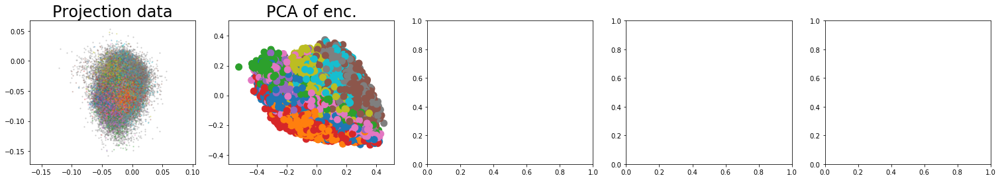

In [26]:
plot_umap_classif_results(model, X_valid, Y_valid, X_train, X_labeled, Y_labeled, batch_size, cmap='tab10', cmap2='tab10')

### Train model

In [27]:
from tfumap.paths import MODEL_DIR

In [28]:
batch = 0; epoch = 0
N_EPOCHS = 100
BATCHES_PER_EPOCH = int(n_edges_per_epoch / batch_size)

In [29]:
# early stopping parameters
patience = 10000 # wait this many batches without improvement before early stopping
min_delta = 0.0001 # threshold for what counts as an improvement
best_acc = 0 # the best current accuracy score
last_improvement = 0 # delta between current batch, and the last batch that was an improvement
best_saved_acc = 0 # best accuracy on valid data that has been checkpointed
best_saved_batch = 0 # batch number for last good batch
max_reinitialize_delta = .01 # minimum loss in accuracy resulting in reinitialized weights
plot_frequency = 2500 # how frequently to plot
save_frequency = 2500 # how frequently to save batches
early_stopping = False
# where to save checkpoints
cpt_path = MODEL_DIR / 'semisupervised' / dataset / datestring

In [30]:
%load_ext memory_profiler

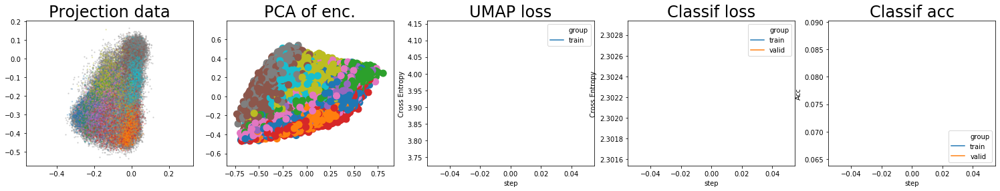

batch: 0 | train acc: 0.089 | val acc: 0.065
tf.Tensor(0.065, shape=(), dtype=float32) -0.01
saving weights


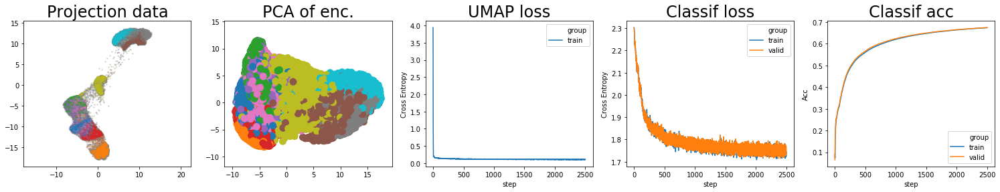

batch: 2500 | train acc: 0.6742 | val acc: 0.6748
tf.Tensor(0.6747569, shape=(), dtype=float32) 0.05499999761581421
saving weights


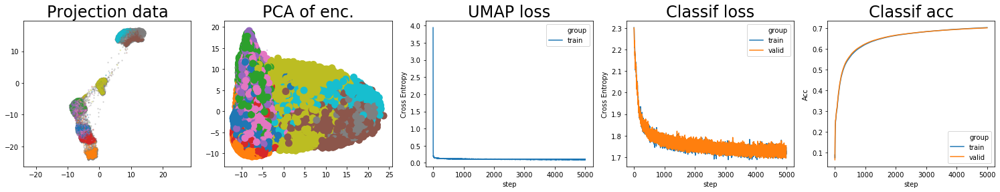

batch: 5000 | train acc: 0.7018 | val acc: 0.7006
tf.Tensor(0.7005513, shape=(), dtype=float32) 0.6647568845748901
saving weights


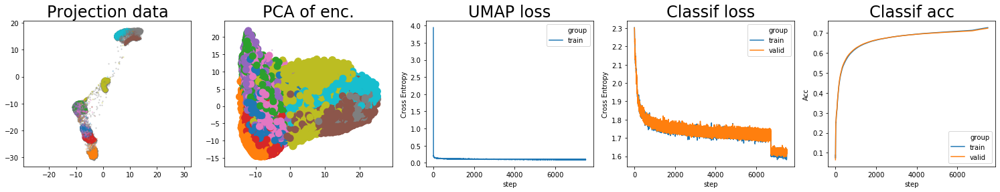

batch: 7500 | train acc: 0.7266 | val acc: 0.7236
tf.Tensor(0.72357875, shape=(), dtype=float32) 0.6905512714385986
saving weights


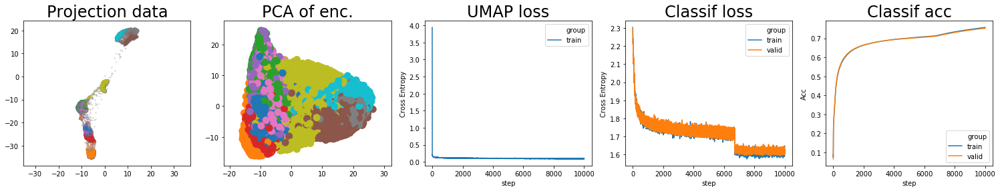

batch: 10000 | train acc: 0.7573 | val acc: 0.7531
tf.Tensor(0.7530884, shape=(), dtype=float32) 0.7135787510871887
saving weights


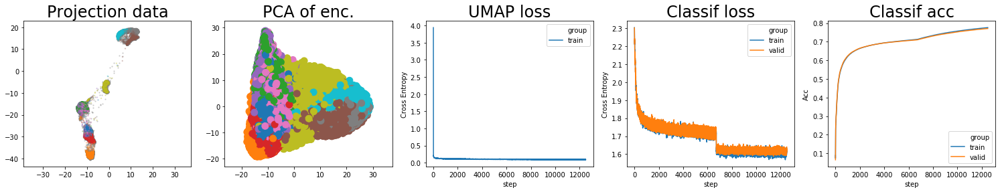

batch: 12500 | train acc: 0.7762 | val acc: 0.7712
tf.Tensor(0.7712466, shape=(), dtype=float32) 0.7430884146690369
saving weights


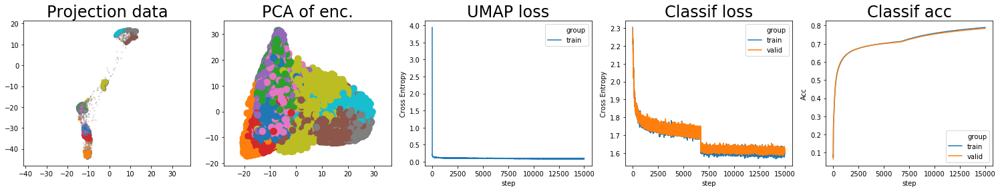

batch: 15000 | train acc: 0.7896 | val acc: 0.7841
tf.Tensor(0.7840841, shape=(), dtype=float32) 0.761246612071991
saving weights


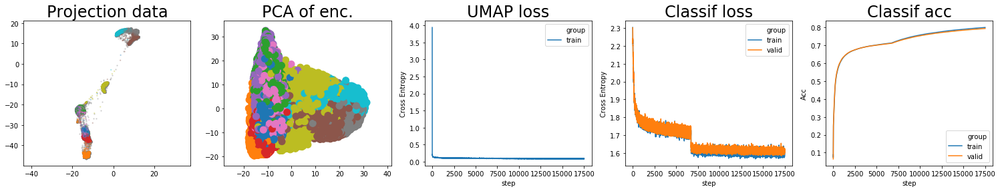

batch: 17500 | train acc: 0.7994 | val acc: 0.7934
tf.Tensor(0.79341847, shape=(), dtype=float32) 0.7740840816497803
saving weights


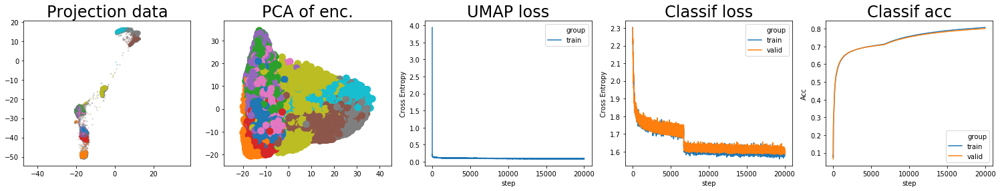

batch: 20000 | train acc: 0.8073 | val acc: 0.8009
tf.Tensor(0.8008606, shape=(), dtype=float32) 0.7834184670448303
saving weights


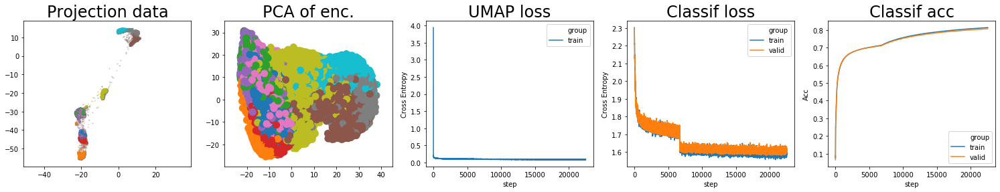

batch: 22500 | train acc: 0.8137 | val acc: 0.8067
tf.Tensor(0.8067208, shape=(), dtype=float32) 0.790860583782196
saving weights


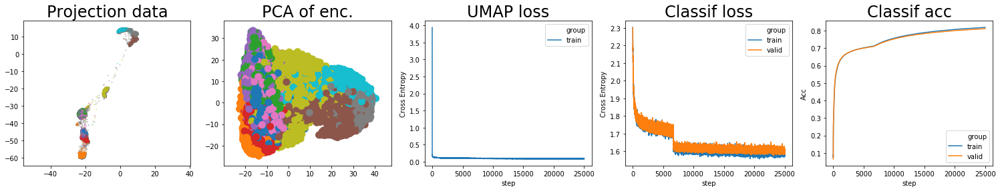

batch: 25000 | train acc: 0.8189 | val acc: 0.8116
tf.Tensor(0.8116199, shape=(), dtype=float32) 0.7967207932472229
saving weights


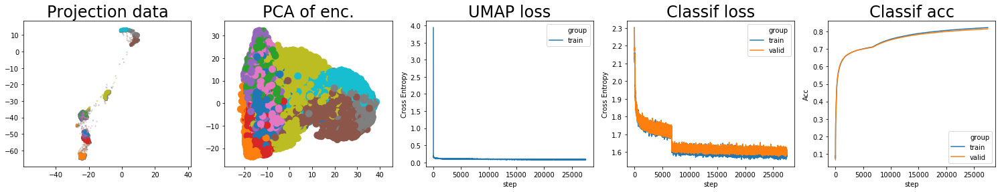

batch: 27500 | train acc: 0.8235 | val acc: 0.8161
tf.Tensor(0.81606126, shape=(), dtype=float32) 0.8016198778152466
saving weights


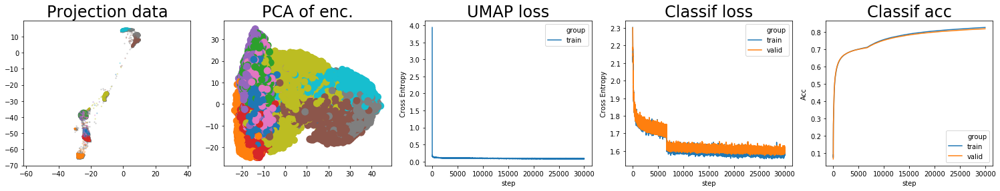

batch: 30000 | train acc: 0.8276 | val acc: 0.8198
tf.Tensor(0.8198264, shape=(), dtype=float32) 0.80606125831604
saving weights


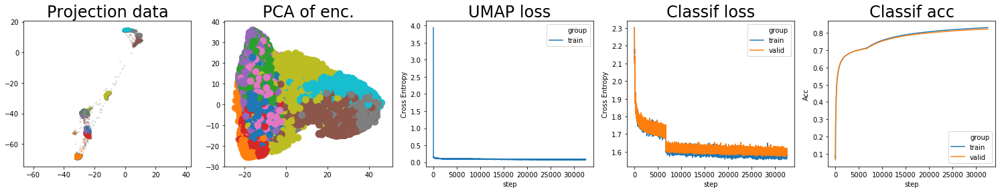

batch: 32500 | train acc: 0.8311 | val acc: 0.8231
tf.Tensor(0.8231038, shape=(), dtype=float32) 0.8098264241218567
saving weights


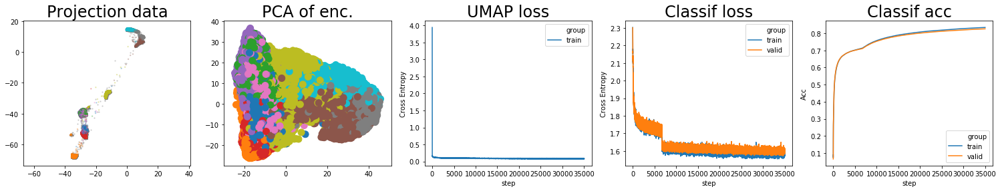

batch: 35000 | train acc: 0.834 | val acc: 0.8259
tf.Tensor(0.825901, shape=(), dtype=float32) 0.8131037855148315
saving weights


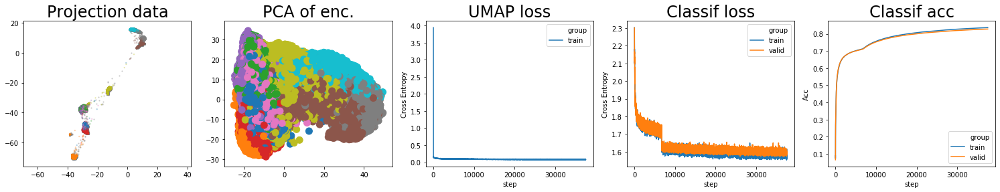

batch: 37500 | train acc: 0.8367 | val acc: 0.8284
tf.Tensor(0.8284357, shape=(), dtype=float32) 0.8159009718894958
saving weights


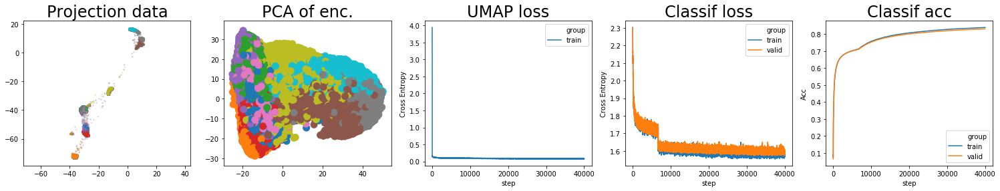

batch: 40000 | train acc: 0.8391 | val acc: 0.8306
tf.Tensor(0.8306459, shape=(), dtype=float32) 0.8184357190132141
saving weights


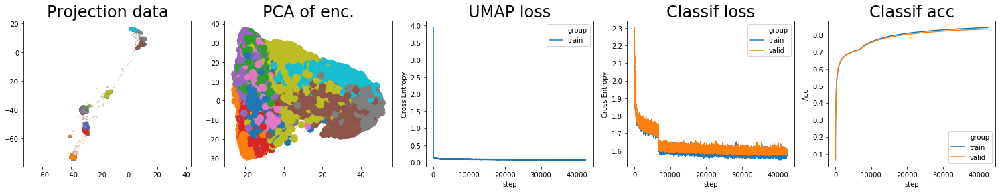

batch: 42500 | train acc: 0.8413 | val acc: 0.8326
tf.Tensor(0.83262765, shape=(), dtype=float32) 0.8206459188461304
saving weights


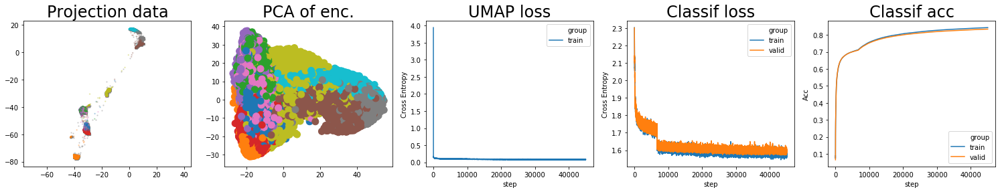

batch: 45000 | train acc: 0.8434 | val acc: 0.8345
tf.Tensor(0.83449996, shape=(), dtype=float32) 0.8226276540756225
saving weights


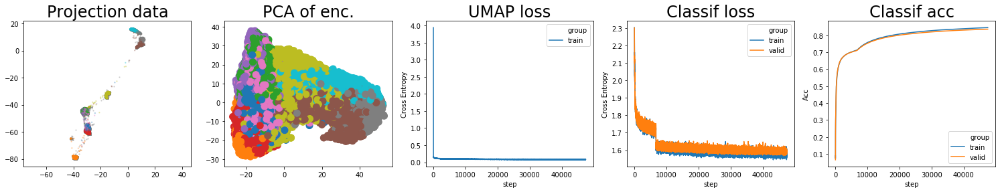

batch: 47500 | train acc: 0.8453 | val acc: 0.8362
tf.Tensor(0.8361974, shape=(), dtype=float32) 0.8244999551773071
saving weights


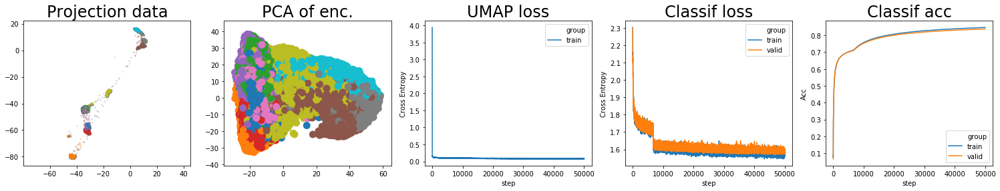

batch: 50000 | train acc: 0.8471 | val acc: 0.8378
tf.Tensor(0.8378103, shape=(), dtype=float32) 0.8261973762512207
saving weights


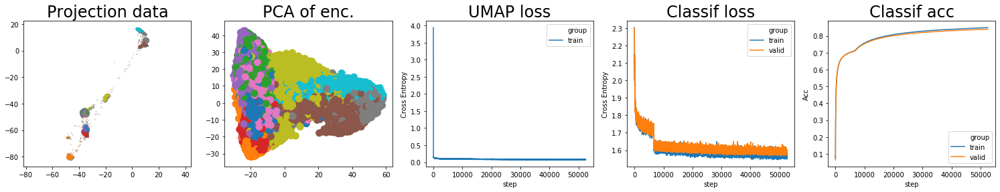

batch: 52500 | train acc: 0.8487 | val acc: 0.8392
tf.Tensor(0.83922654, shape=(), dtype=float32) 0.8278102779388428
saving weights


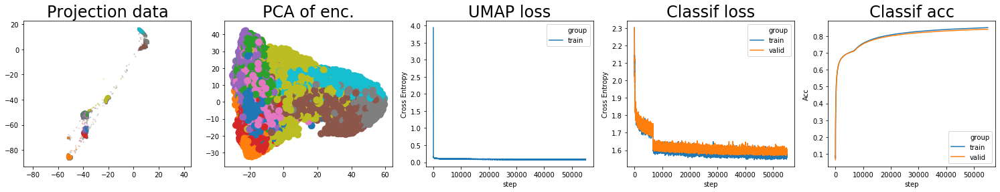

batch: 55000 | train acc: 0.8503 | val acc: 0.8405
tf.Tensor(0.84053063, shape=(), dtype=float32) 0.8292265439033508
saving weights


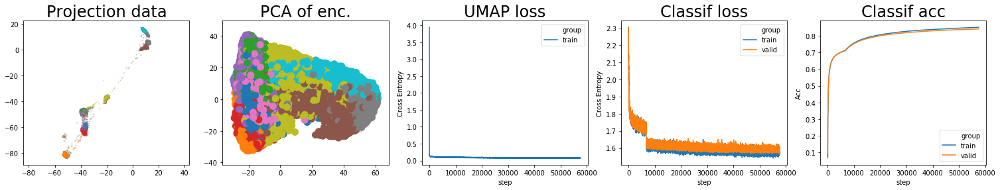

batch: 57500 | train acc: 0.8518 | val acc: 0.8417
tf.Tensor(0.84173715, shape=(), dtype=float32) 0.8305306339263916
saving weights


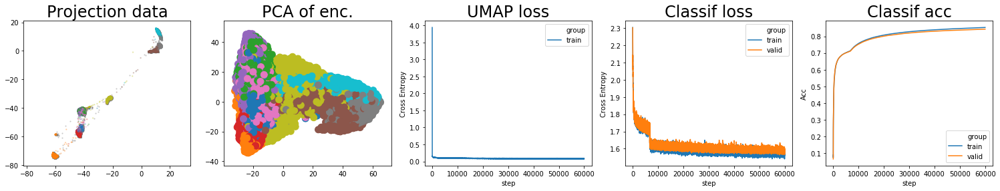

batch: 60000 | train acc: 0.8531 | val acc: 0.8429
tf.Tensor(0.84286743, shape=(), dtype=float32) 0.831737151145935
saving weights


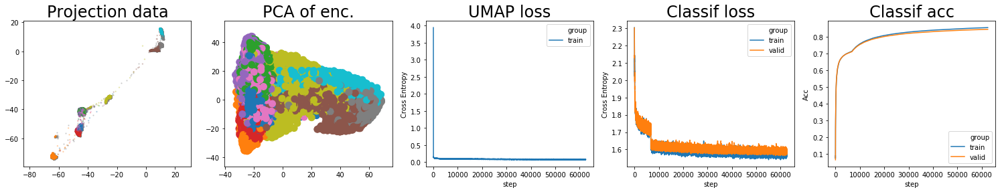

batch: 62500 | train acc: 0.8544 | val acc: 0.8439
tf.Tensor(0.84394854, shape=(), dtype=float32) 0.8328674340248108
saving weights


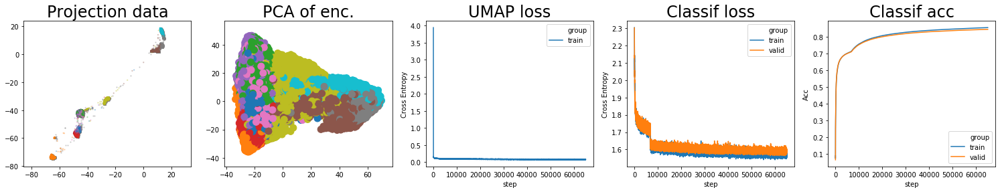

batch: 65000 | train acc: 0.8556 | val acc: 0.8449
tf.Tensor(0.8449338, shape=(), dtype=float32) 0.8339485430717468
saving weights


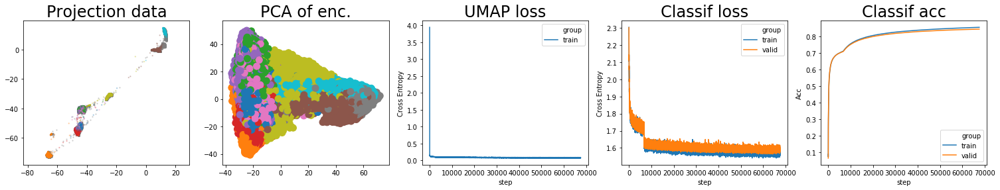

batch: 67500 | train acc: 0.8567 | val acc: 0.8458
tf.Tensor(0.8458201, shape=(), dtype=float32) 0.834933807849884
saving weights


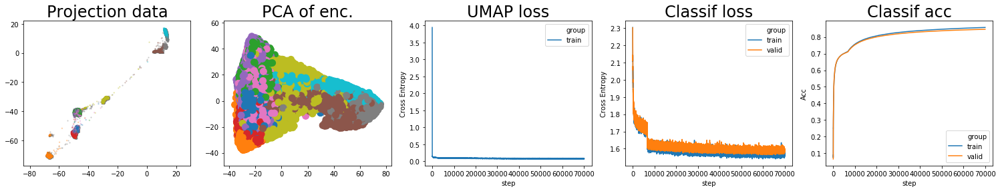

batch: 70000 | train acc: 0.8578 | val acc: 0.8467
tf.Tensor(0.84666765, shape=(), dtype=float32) 0.8358201289176941
saving weights


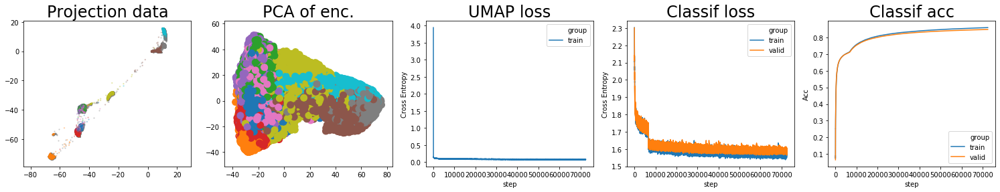

batch: 72500 | train acc: 0.8589 | val acc: 0.8475
tf.Tensor(0.84750307, shape=(), dtype=float32) 0.8366676473617554
saving weights


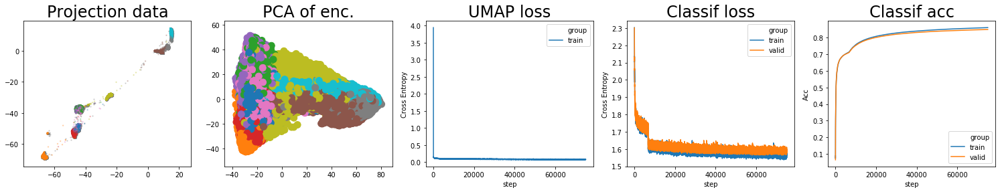

batch: 75000 | train acc: 0.8599 | val acc: 0.8483
tf.Tensor(0.8482759, shape=(), dtype=float32) 0.8375030660629272
saving weights


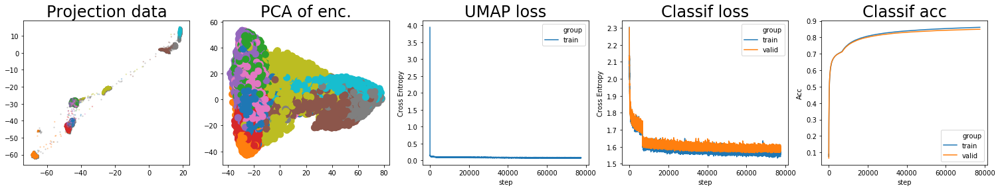

batch: 77500 | train acc: 0.8608 | val acc: 0.849
tf.Tensor(0.8490002, shape=(), dtype=float32) 0.838275899887085
saving weights


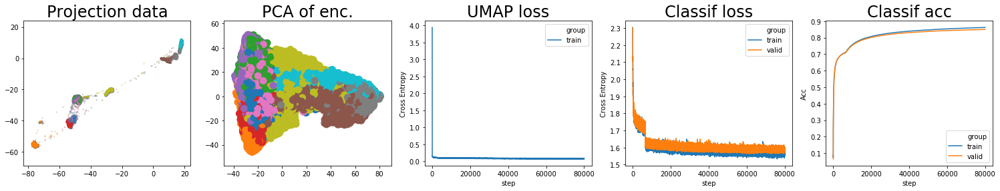

batch: 80000 | train acc: 0.8617 | val acc: 0.8497
tf.Tensor(0.8496744, shape=(), dtype=float32) 0.8390002155303955
saving weights


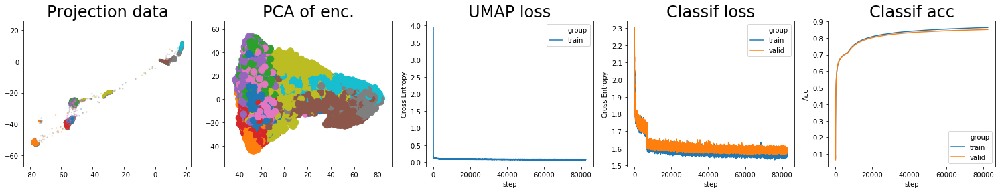

batch: 82500 | train acc: 0.8626 | val acc: 0.8503
tf.Tensor(0.8503321, shape=(), dtype=float32) 0.8396744036674499
saving weights


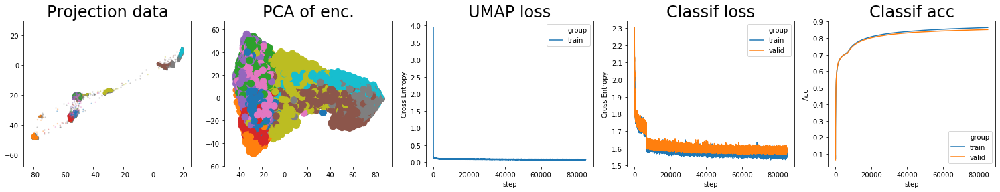

batch: 85000 | train acc: 0.8634 | val acc: 0.851
tf.Tensor(0.850958, shape=(), dtype=float32) 0.8403320813179016
saving weights


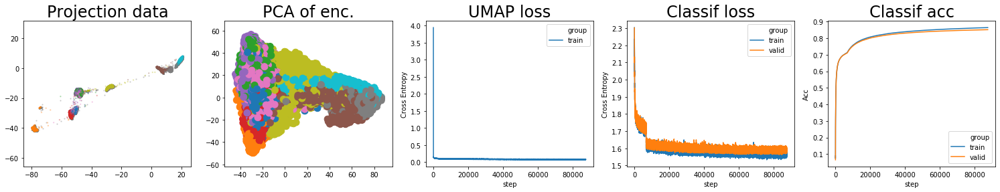

batch: 87500 | train acc: 0.8642 | val acc: 0.8515
tf.Tensor(0.8515177, shape=(), dtype=float32) 0.840957989692688
saving weights


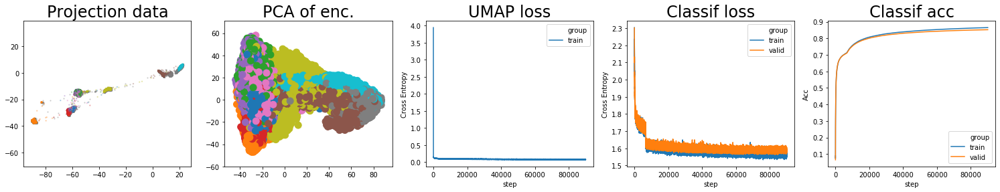

batch: 90000 | train acc: 0.8649 | val acc: 0.852
tf.Tensor(0.8520384, shape=(), dtype=float32) 0.8415176773071289
saving weights


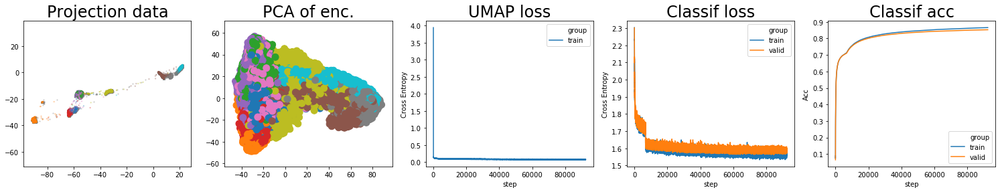

batch: 92500 | train acc: 0.8657 | val acc: 0.8526
tf.Tensor(0.8525812, shape=(), dtype=float32) 0.8420383834838867
saving weights


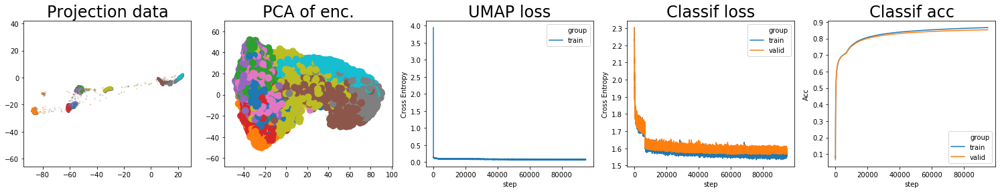

batch: 95000 | train acc: 0.8664 | val acc: 0.8531
tf.Tensor(0.8530947, shape=(), dtype=float32) 0.8425812029838562
saving weights


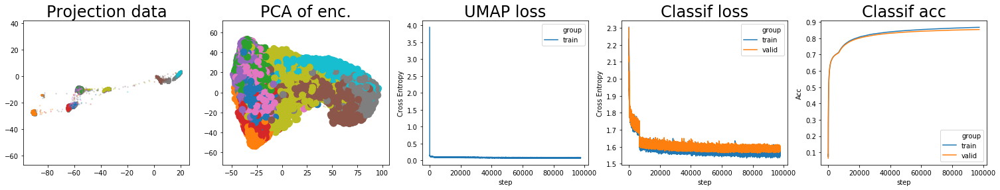

batch: 97500 | train acc: 0.8671 | val acc: 0.8536
tf.Tensor(0.8535669, shape=(), dtype=float32) 0.8430946969985962
saving weights


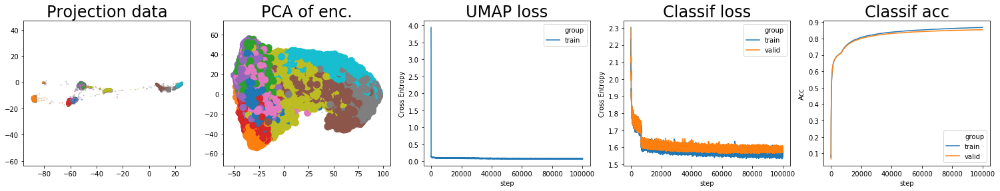

batch: 100000 | train acc: 0.8678 | val acc: 0.854
tf.Tensor(0.8540364, shape=(), dtype=float32) 0.8435668849945068
saving weights


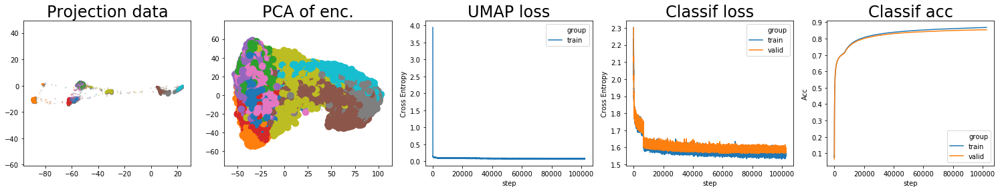

batch: 102500 | train acc: 0.8684 | val acc: 0.8545
tf.Tensor(0.8544838, shape=(), dtype=float32) 0.8440363907814026
saving weights


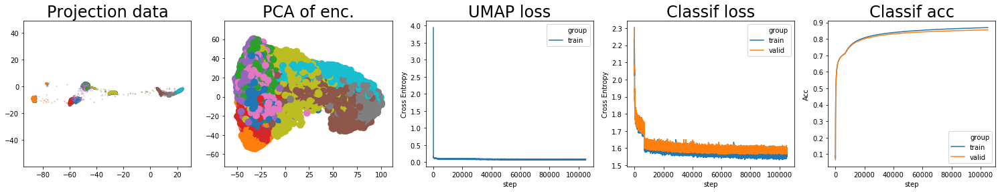

batch: 105000 | train acc: 0.8691 | val acc: 0.8549
tf.Tensor(0.85491186, shape=(), dtype=float32) 0.8444837832450867
saving weights


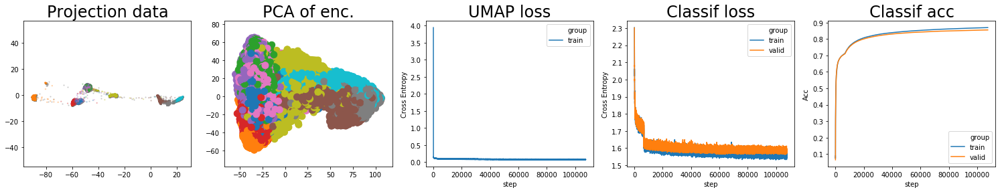

batch: 107500 | train acc: 0.8697 | val acc: 0.8553
tf.Tensor(0.8553259, shape=(), dtype=float32) 0.8449118638038635
saving weights


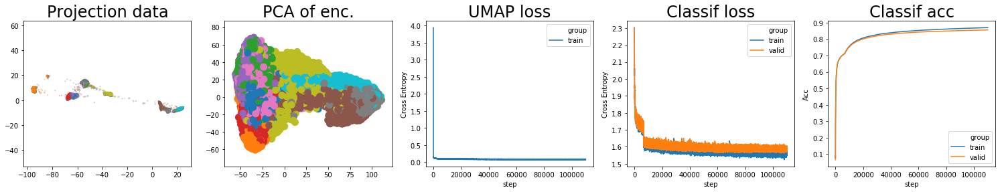

batch: 110000 | train acc: 0.8703 | val acc: 0.8557
tf.Tensor(0.8557231, shape=(), dtype=float32) 0.8453258776664734
saving weights


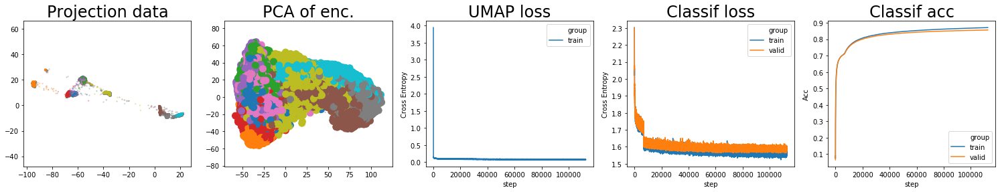

batch: 112500 | train acc: 0.8709 | val acc: 0.8561
tf.Tensor(0.85611486, shape=(), dtype=float32) 0.8457230830192566
saving weights


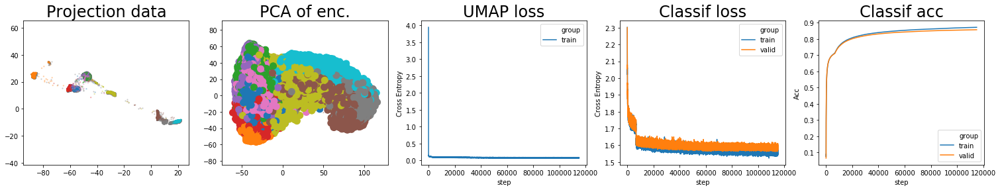

batch: 115000 | train acc: 0.8715 | val acc: 0.8565
tf.Tensor(0.85647345, shape=(), dtype=float32) 0.8461148643493652
saving weights


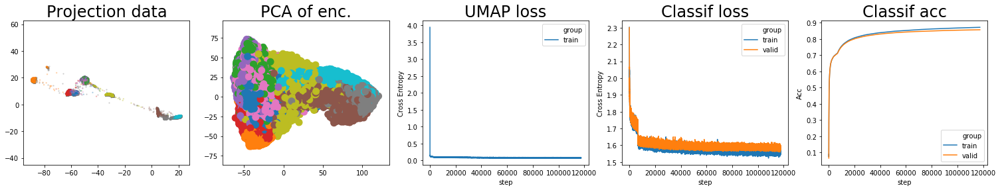

batch: 117500 | train acc: 0.872 | val acc: 0.8568
tf.Tensor(0.85683006, shape=(), dtype=float32) 0.846473445892334
saving weights


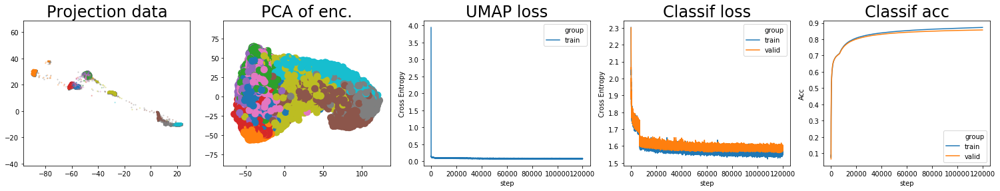

batch: 120000 | train acc: 0.8725 | val acc: 0.8572
tf.Tensor(0.85715693, shape=(), dtype=float32) 0.8468300604820251
saving weights


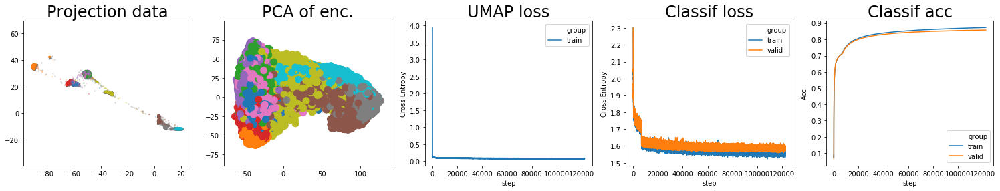

batch: 122500 | train acc: 0.8731 | val acc: 0.8575
tf.Tensor(0.8574694, shape=(), dtype=float32) 0.8471569323539734
saving weights


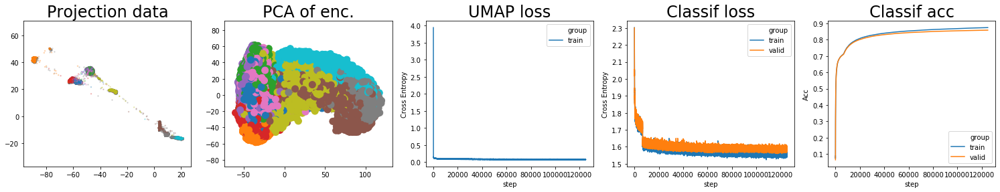

batch: 125000 | train acc: 0.8736 | val acc: 0.8578
tf.Tensor(0.85778093, shape=(), dtype=float32) 0.847469379901886
saving weights


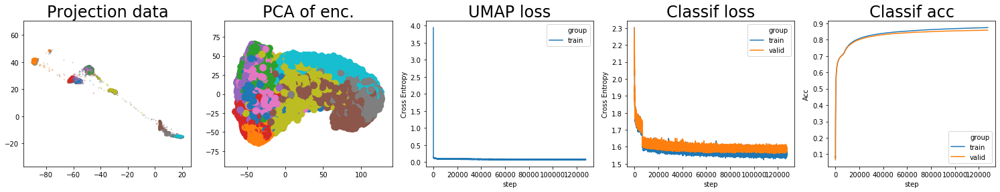

batch: 127500 | train acc: 0.8741 | val acc: 0.8581
tf.Tensor(0.85805297, shape=(), dtype=float32) 0.8477809333801269
saving weights


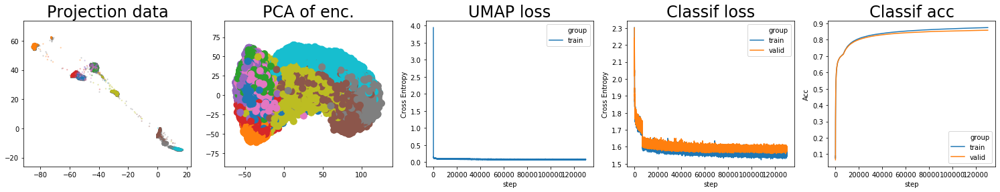

batch: 130000 | train acc: 0.8745 | val acc: 0.8583
tf.Tensor(0.8583392, shape=(), dtype=float32) 0.8480529689788818
saving weights


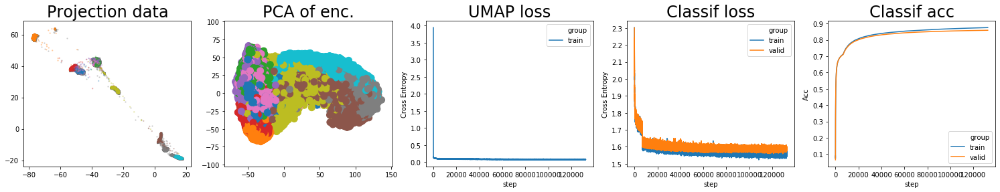

batch: 132500 | train acc: 0.875 | val acc: 0.8586
tf.Tensor(0.858618, shape=(), dtype=float32) 0.8483391904830933
saving weights


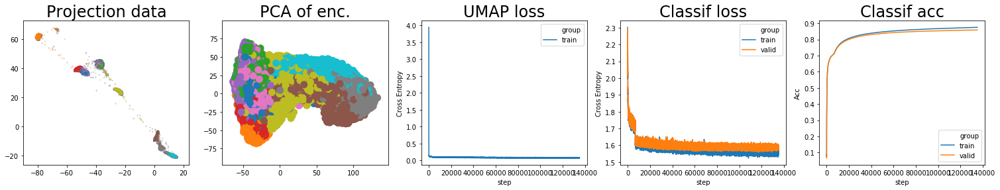

batch: 135000 | train acc: 0.8755 | val acc: 0.8589
tf.Tensor(0.8589215, shape=(), dtype=float32) 0.8486180210113525
saving weights


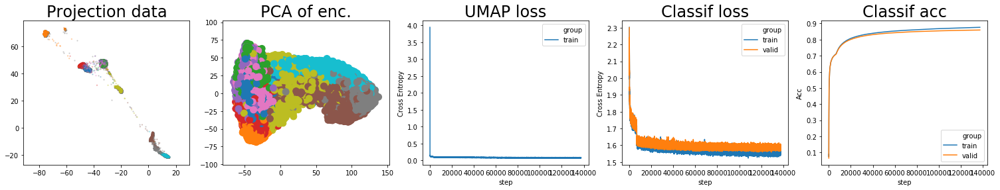

batch: 137500 | train acc: 0.8761 | val acc: 0.8593
tf.Tensor(0.8593076, shape=(), dtype=float32) 0.8489215278625488
saving weights


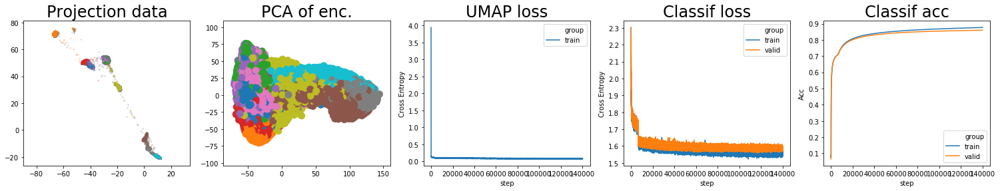

batch: 140000 | train acc: 0.8767 | val acc: 0.8597
tf.Tensor(0.8596871, shape=(), dtype=float32) 0.849307587146759
saving weights


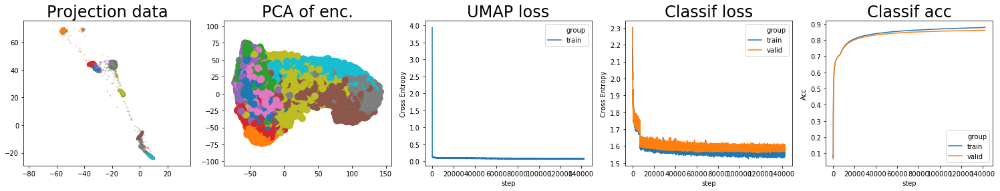

batch: 142500 | train acc: 0.8772 | val acc: 0.86
tf.Tensor(0.8600432, shape=(), dtype=float32) 0.8496870899200439
saving weights


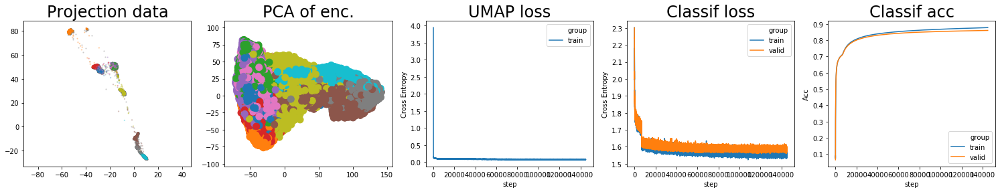

batch: 145000 | train acc: 0.8778 | val acc: 0.8604
tf.Tensor(0.86038935, shape=(), dtype=float32) 0.8500432276725769
saving weights


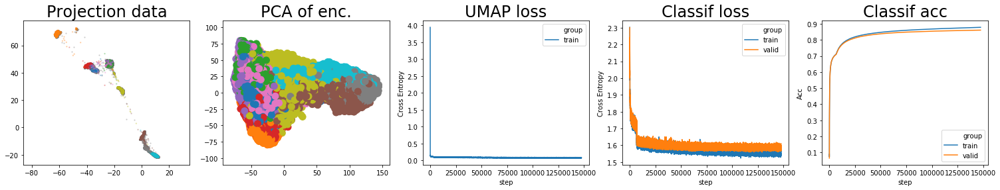

batch: 147500 | train acc: 0.8783 | val acc: 0.8607
tf.Tensor(0.8607429, shape=(), dtype=float32) 0.8503893518447876
saving weights


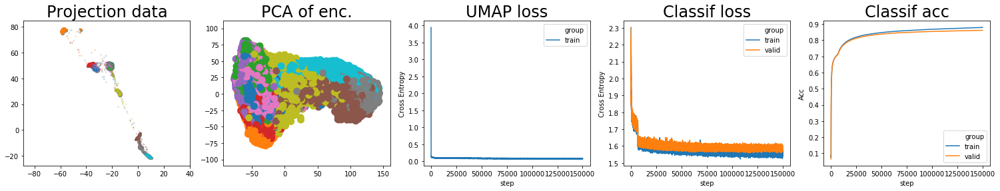

batch: 150000 | train acc: 0.8788 | val acc: 0.8611
tf.Tensor(0.8610934, shape=(), dtype=float32) 0.8507429265975952
saving weights


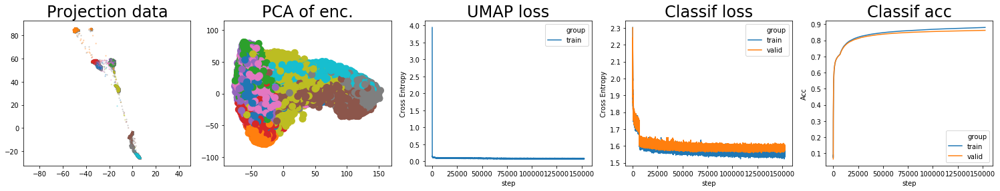

batch: 152500 | train acc: 0.8794 | val acc: 0.8614
tf.Tensor(0.86142576, shape=(), dtype=float32) 0.8510934019088745
saving weights


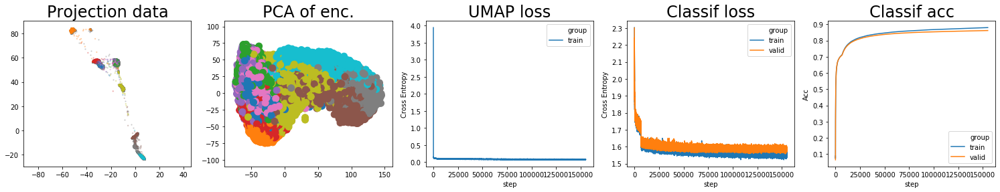

batch: 155000 | train acc: 0.8799 | val acc: 0.8618
tf.Tensor(0.8617584, shape=(), dtype=float32) 0.8514257574081421
saving weights


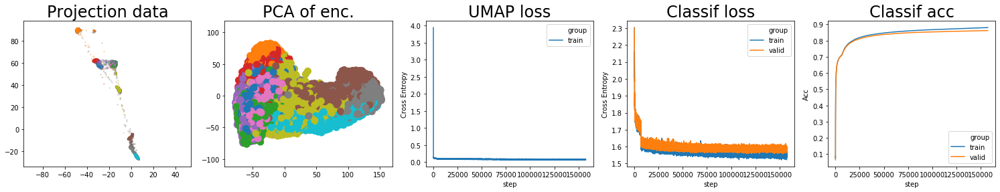

batch: 157500 | train acc: 0.8804 | val acc: 0.8621
tf.Tensor(0.86206865, shape=(), dtype=float32) 0.8517584109306335
saving weights


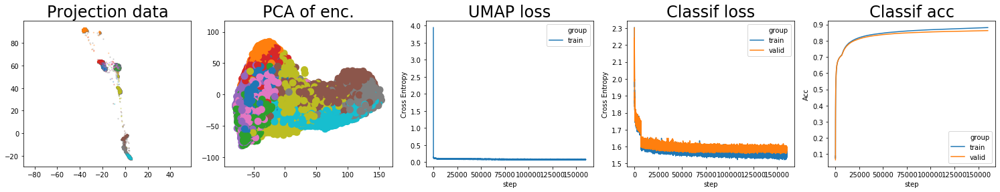

batch: 160000 | train acc: 0.8809 | val acc: 0.8624
tf.Tensor(0.8623853, shape=(), dtype=float32) 0.8520686531066894
saving weights


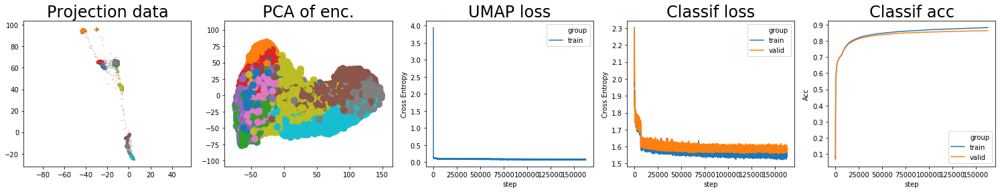

batch: 162500 | train acc: 0.8814 | val acc: 0.8627
tf.Tensor(0.8627001, shape=(), dtype=float32) 0.8523852729797363
saving weights


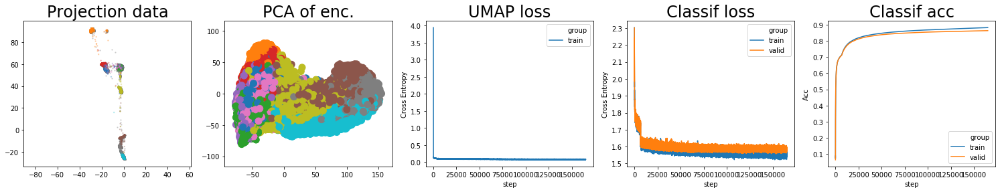

batch: 165000 | train acc: 0.8819 | val acc: 0.863
tf.Tensor(0.8630063, shape=(), dtype=float32) 0.8527001047134399
saving weights


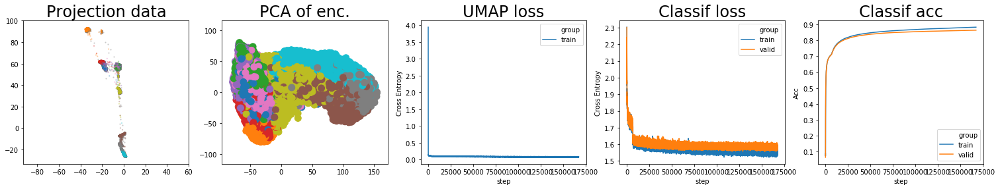

batch: 167500 | train acc: 0.8823 | val acc: 0.8633
tf.Tensor(0.8633045, shape=(), dtype=float32) 0.8530062937736511
saving weights


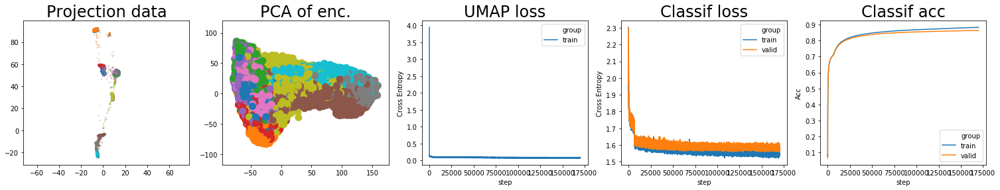

batch: 170000 | train acc: 0.8828 | val acc: 0.8636
tf.Tensor(0.863581, shape=(), dtype=float32) 0.8533044958114624
saving weights


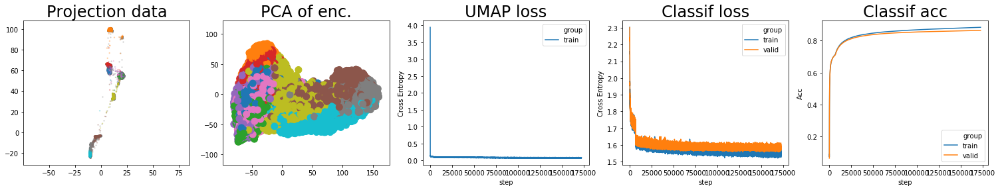

batch: 172500 | train acc: 0.8832 | val acc: 0.8638
tf.Tensor(0.8638472, shape=(), dtype=float32) 0.8535810017585754
saving weights


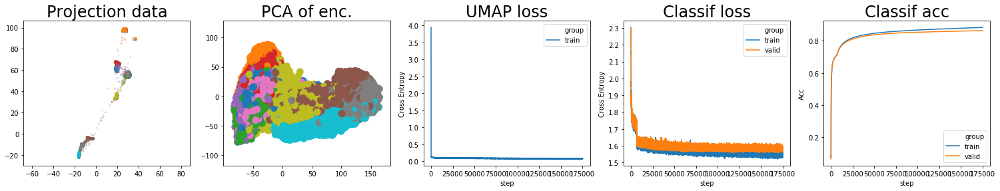

batch: 175000 | train acc: 0.8837 | val acc: 0.8641
tf.Tensor(0.8641127, shape=(), dtype=float32) 0.8538471961021423
saving weights


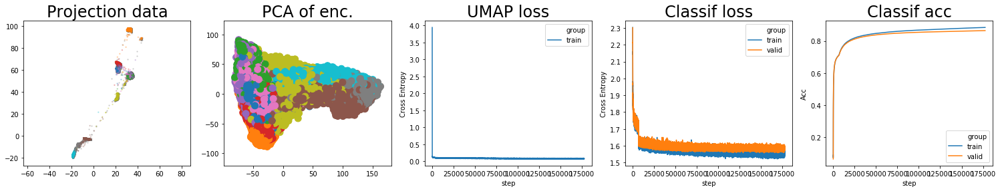

batch: 177500 | train acc: 0.8841 | val acc: 0.8644
tf.Tensor(0.8643767, shape=(), dtype=float32) 0.8541126751899719
saving weights


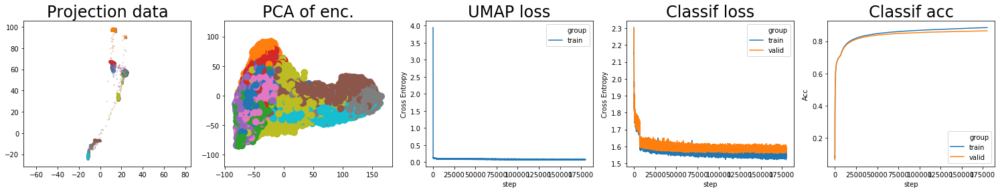

batch: 180000 | train acc: 0.8845 | val acc: 0.8646
tf.Tensor(0.8646229, shape=(), dtype=float32) 0.8543767237663269
saving weights


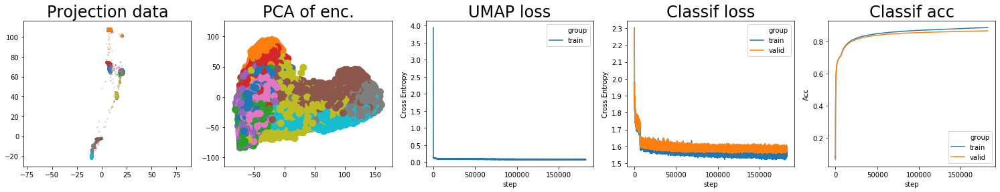

batch: 182500 | train acc: 0.8849 | val acc: 0.8649
tf.Tensor(0.86485636, shape=(), dtype=float32) 0.8546228909492493
saving weights


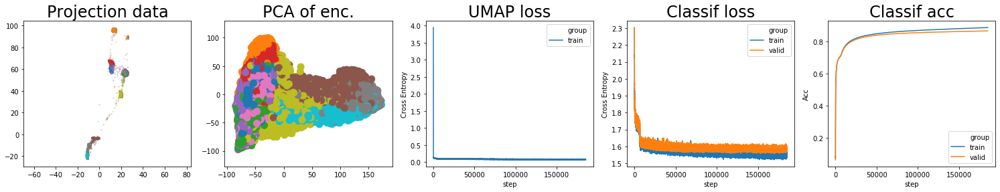

batch: 185000 | train acc: 0.8853 | val acc: 0.8651
tf.Tensor(0.86508256, shape=(), dtype=float32) 0.8548563623428345
saving weights


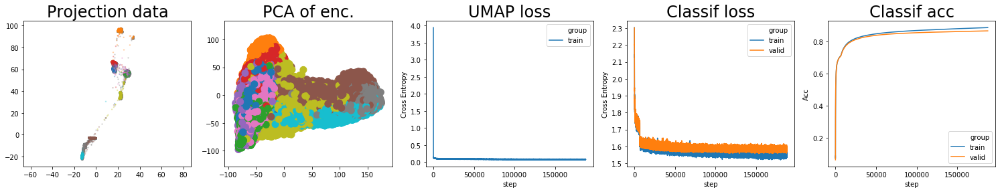

batch: 187500 | train acc: 0.8857 | val acc: 0.8653
tf.Tensor(0.8653113, shape=(), dtype=float32) 0.8550825619697571
saving weights


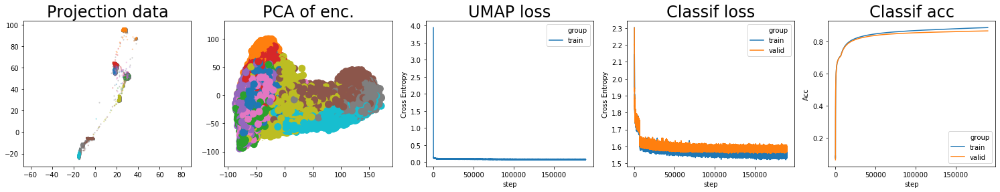

batch: 190000 | train acc: 0.886 | val acc: 0.8655
tf.Tensor(0.865534, shape=(), dtype=float32) 0.855311324596405
saving weights


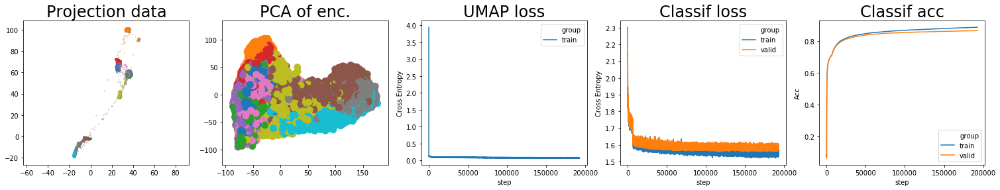

batch: 192500 | train acc: 0.8864 | val acc: 0.8658
tf.Tensor(0.8657608, shape=(), dtype=float32) 0.8555340075492859
saving weights


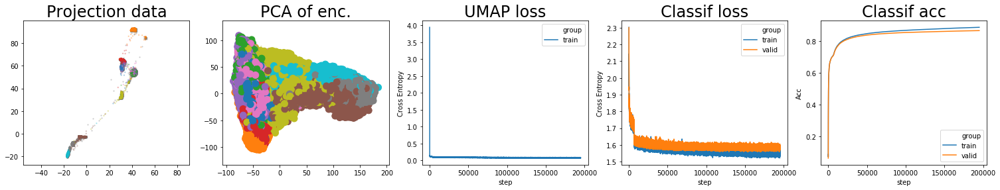

batch: 195000 | train acc: 0.8868 | val acc: 0.866
tf.Tensor(0.86598045, shape=(), dtype=float32) 0.8557608032226562
saving weights


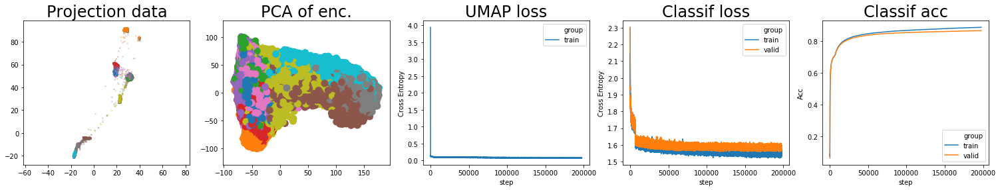

batch: 197500 | train acc: 0.8871 | val acc: 0.8662
tf.Tensor(0.866181, shape=(), dtype=float32) 0.8559804463386536
saving weights


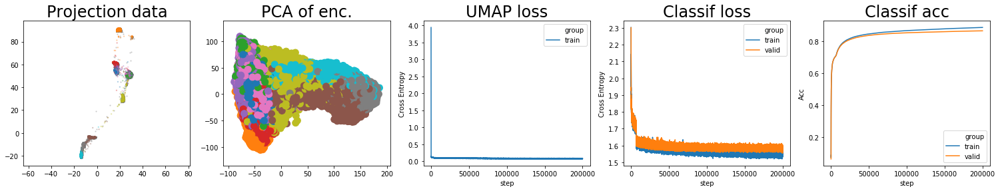

batch: 200000 | train acc: 0.8875 | val acc: 0.8664
tf.Tensor(0.8663858, shape=(), dtype=float32) 0.8561810159683227
saving weights


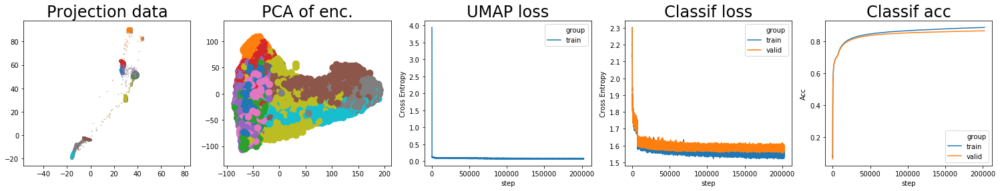

batch: 202500 | train acc: 0.8878 | val acc: 0.8666
tf.Tensor(0.86658365, shape=(), dtype=float32) 0.856385817527771
saving weights


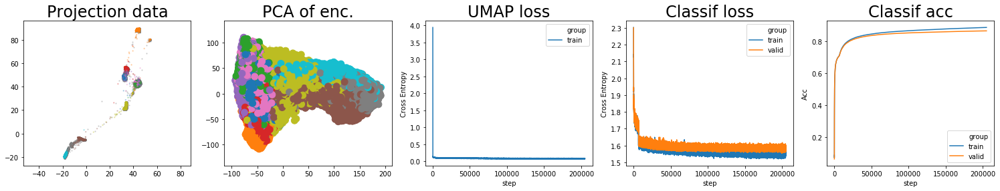

batch: 205000 | train acc: 0.8882 | val acc: 0.8668
tf.Tensor(0.86678153, shape=(), dtype=float32) 0.8565836453437805
saving weights


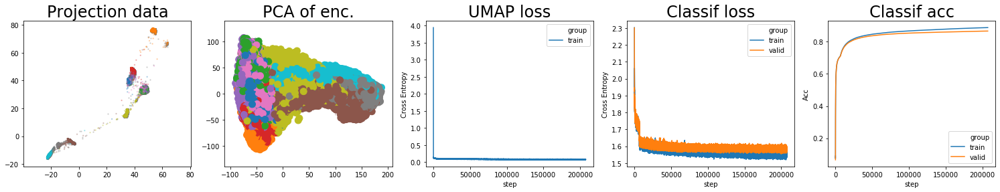

batch: 207500 | train acc: 0.8885 | val acc: 0.867
tf.Tensor(0.8669706, shape=(), dtype=float32) 0.8567815327644348
saving weights


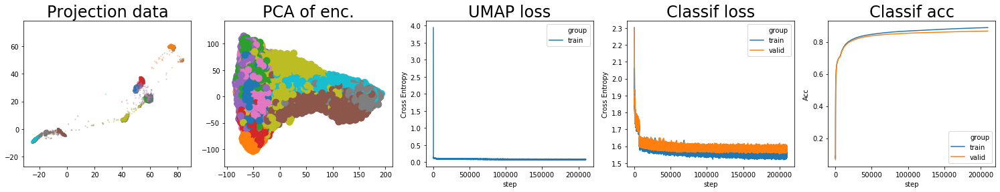

batch: 210000 | train acc: 0.8888 | val acc: 0.8672
tf.Tensor(0.8671571, shape=(), dtype=float32) 0.8569705986976623
saving weights


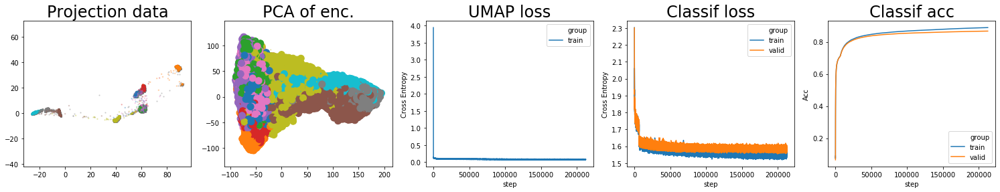

batch: 212500 | train acc: 0.8891 | val acc: 0.8673
tf.Tensor(0.86733544, shape=(), dtype=float32) 0.8571571016311645
saving weights


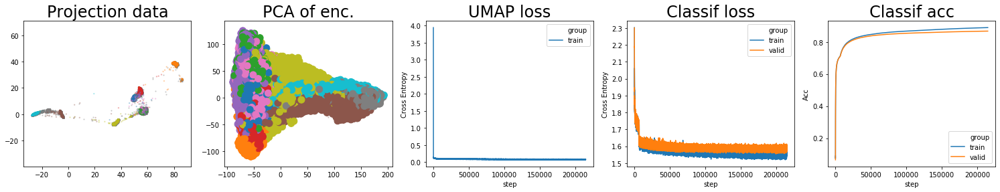

batch: 215000 | train acc: 0.8894 | val acc: 0.8675
tf.Tensor(0.867513, shape=(), dtype=float32) 0.8573354387283325
saving weights


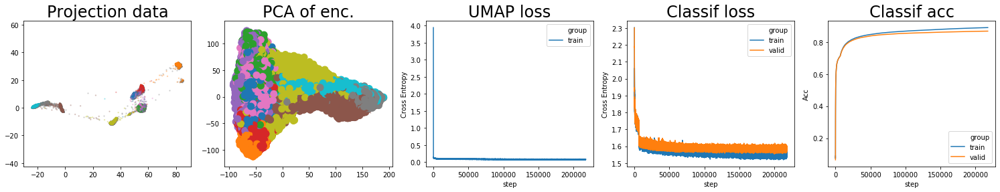

batch: 217500 | train acc: 0.8897 | val acc: 0.8677
tf.Tensor(0.86768305, shape=(), dtype=float32) 0.8575130009651184
saving weights


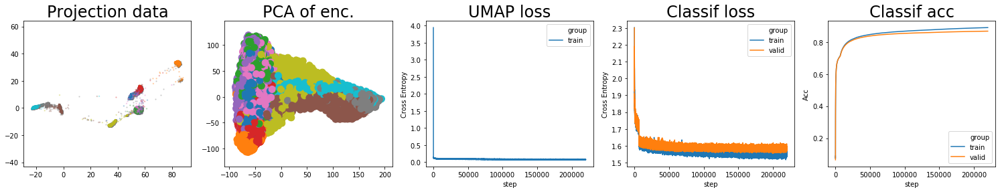

batch: 220000 | train acc: 0.89 | val acc: 0.8679
tf.Tensor(0.8678512, shape=(), dtype=float32) 0.8576830530166626
saving weights


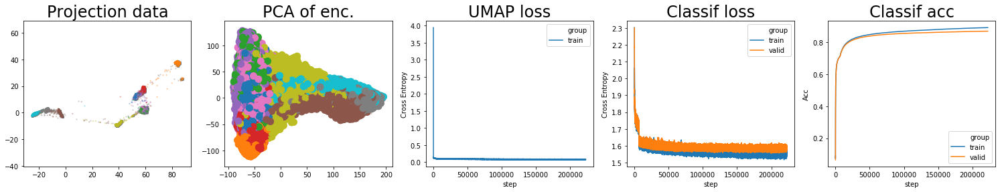

batch: 222500 | train acc: 0.8903 | val acc: 0.868
tf.Tensor(0.8680171, shape=(), dtype=float32) 0.857851197719574
saving weights


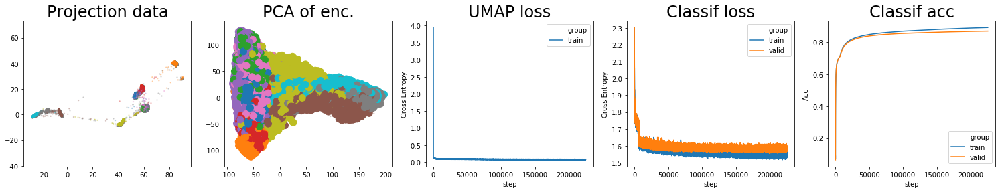

batch: 225000 | train acc: 0.8906 | val acc: 0.8682
tf.Tensor(0.8681842, shape=(), dtype=float32) 0.8580170774459839
saving weights


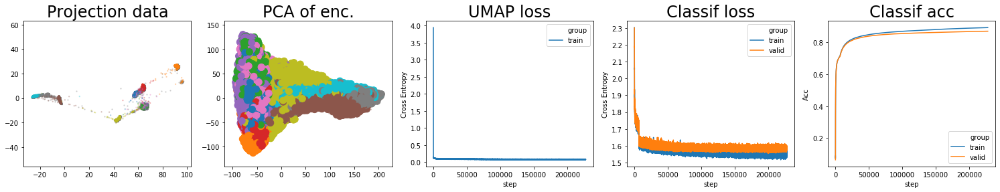

batch: 227500 | train acc: 0.8909 | val acc: 0.8683
tf.Tensor(0.8683497, shape=(), dtype=float32) 0.8581842088699341
saving weights


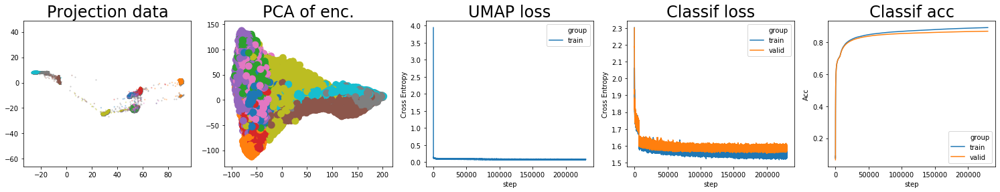

batch: 230000 | train acc: 0.8912 | val acc: 0.8685
tf.Tensor(0.8685058, shape=(), dtype=float32) 0.8583496713638306
saving weights


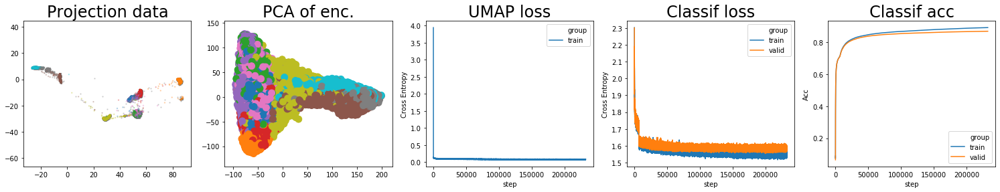

batch: 232500 | train acc: 0.8915 | val acc: 0.8687
tf.Tensor(0.8686577, shape=(), dtype=float32) 0.8585057759284973
saving weights


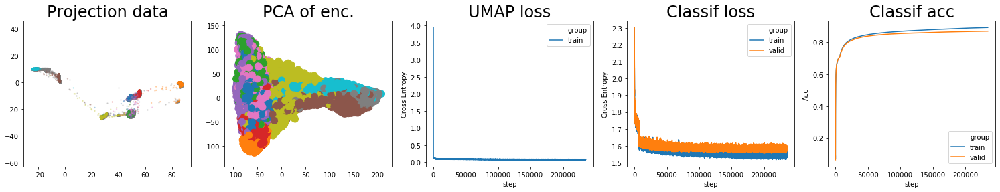

batch: 235000 | train acc: 0.8918 | val acc: 0.8688
tf.Tensor(0.86881185, shape=(), dtype=float32) 0.8586577081680298
saving weights


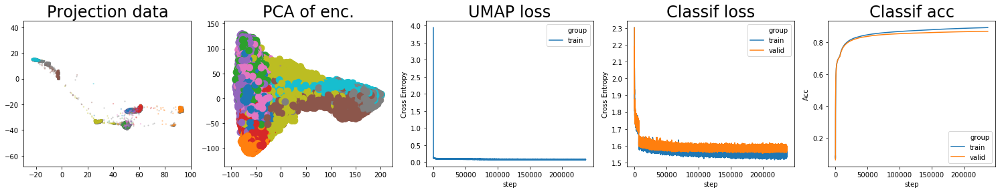

batch: 237500 | train acc: 0.892 | val acc: 0.869
tf.Tensor(0.8689652, shape=(), dtype=float32) 0.8588118457794189
saving weights


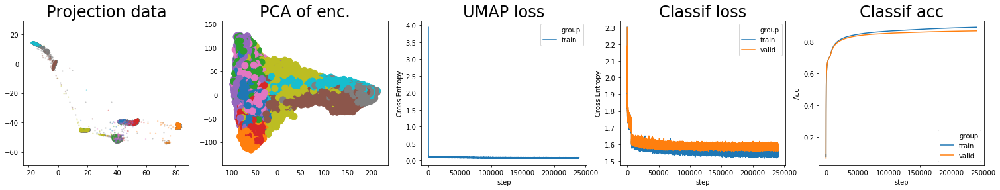

batch: 240000 | train acc: 0.8923 | val acc: 0.8691
tf.Tensor(0.8691124, shape=(), dtype=float32) 0.858965208530426
saving weights


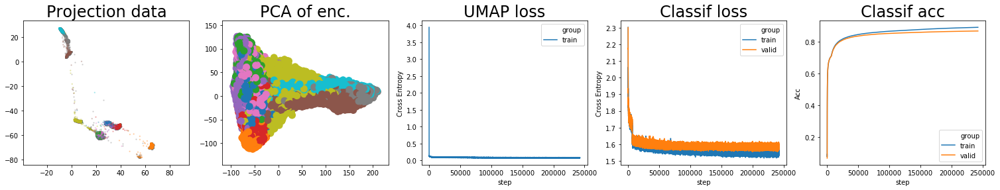

batch: 242500 | train acc: 0.8926 | val acc: 0.8693
tf.Tensor(0.8692535, shape=(), dtype=float32) 0.8591123723983765
saving weights


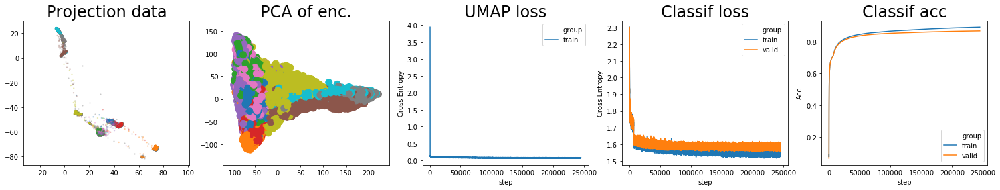

batch: 245000 | train acc: 0.8928 | val acc: 0.8694
tf.Tensor(0.86938846, shape=(), dtype=float32) 0.8592535161972046
saving weights


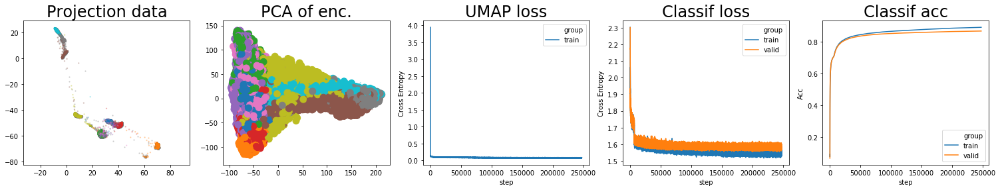

batch: 247500 | train acc: 0.8931 | val acc: 0.8695
tf.Tensor(0.86952806, shape=(), dtype=float32) 0.8593884611129761
saving weights


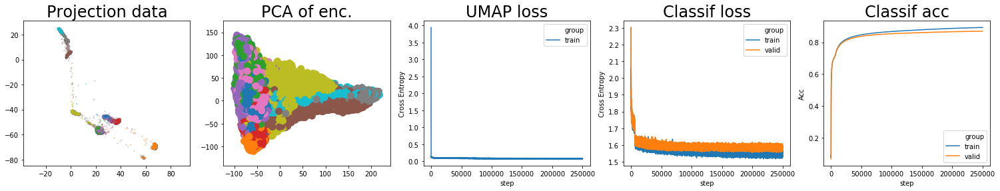

batch: 250000 | train acc: 0.8934 | val acc: 0.8697
tf.Tensor(0.8696701, shape=(), dtype=float32) 0.85952805519104
saving weights


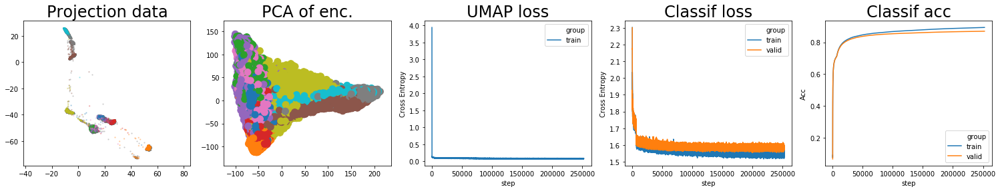

batch: 252500 | train acc: 0.8936 | val acc: 0.8698
tf.Tensor(0.8698054, shape=(), dtype=float32) 0.8596700930595398
saving weights


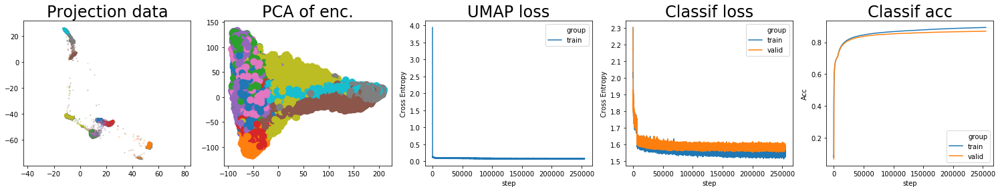

batch: 255000 | train acc: 0.8939 | val acc: 0.8699
tf.Tensor(0.86993796, shape=(), dtype=float32) 0.8598053956031799
saving weights


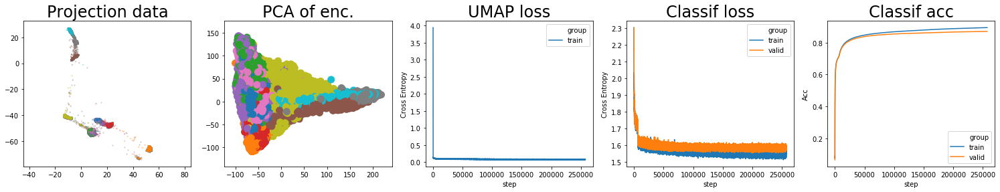

batch: 257500 | train acc: 0.8941 | val acc: 0.8701
tf.Tensor(0.8700562, shape=(), dtype=float32) 0.8599379563331604
saving weights


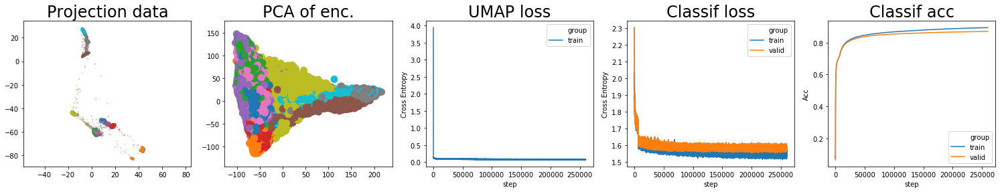

batch: 260000 | train acc: 0.8944 | val acc: 0.8702
tf.Tensor(0.87017965, shape=(), dtype=float32) 0.8600562119483948
saving weights


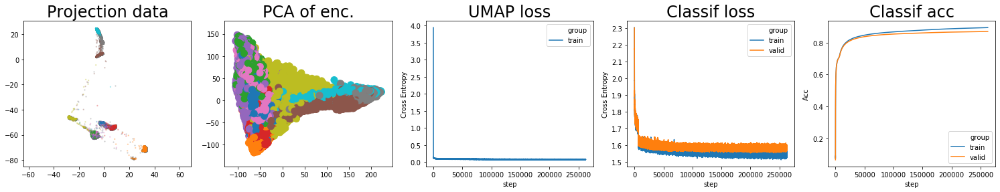

batch: 262500 | train acc: 0.8946 | val acc: 0.8703
tf.Tensor(0.8703013, shape=(), dtype=float32) 0.8601796531677246
saving weights


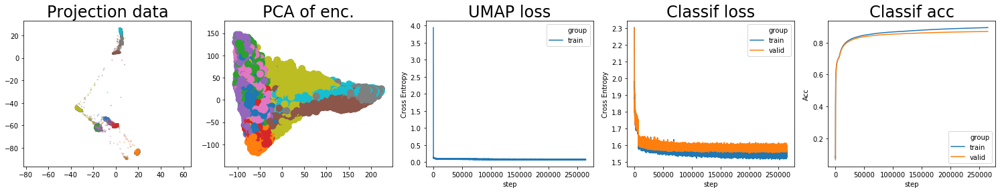

batch: 265000 | train acc: 0.8948 | val acc: 0.8704
tf.Tensor(0.8704165, shape=(), dtype=float32) 0.8603013062477112
saving weights


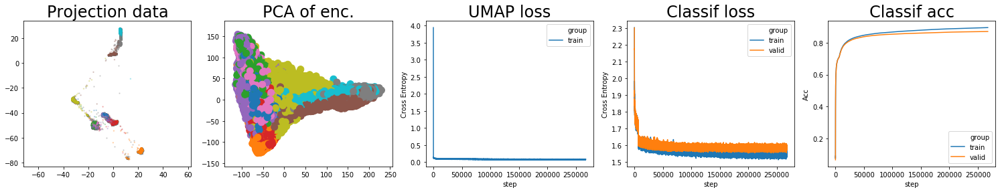

batch: 267500 | train acc: 0.8951 | val acc: 0.8705
tf.Tensor(0.87053174, shape=(), dtype=float32) 0.860416522026062
saving weights


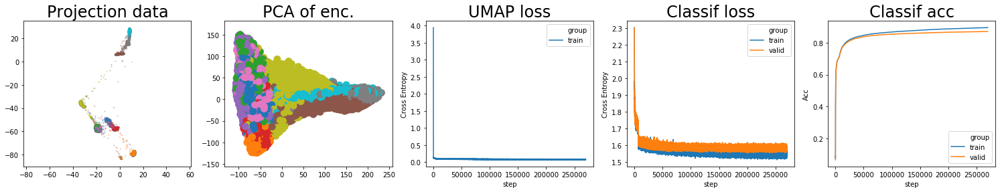

batch: 270000 | train acc: 0.8953 | val acc: 0.8706
tf.Tensor(0.8706434, shape=(), dtype=float32) 0.8605317378044128
saving weights


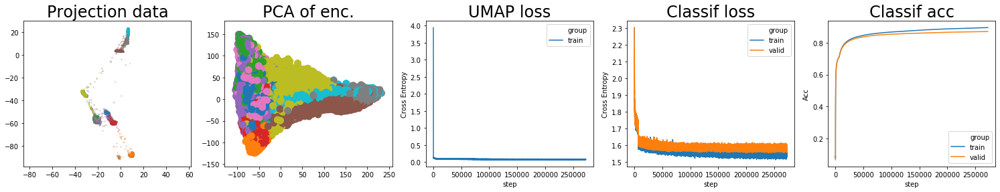

batch: 272500 | train acc: 0.8955 | val acc: 0.8708
tf.Tensor(0.87075424, shape=(), dtype=float32) 0.8606433773040771
saving weights


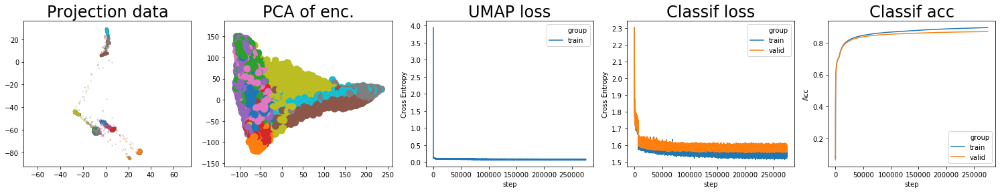

batch: 275000 | train acc: 0.8957 | val acc: 0.8709
tf.Tensor(0.87086797, shape=(), dtype=float32) 0.8607542419433594
saving weights


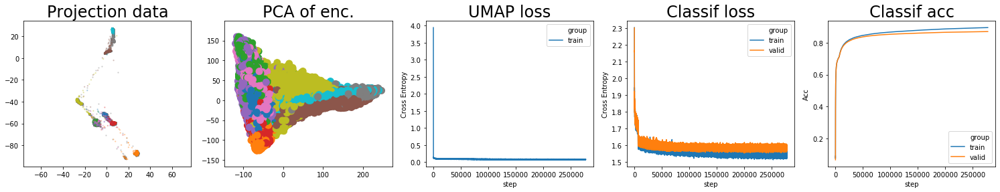

batch: 277500 | train acc: 0.896 | val acc: 0.871
tf.Tensor(0.8709804, shape=(), dtype=float32) 0.8608679676055908
saving weights


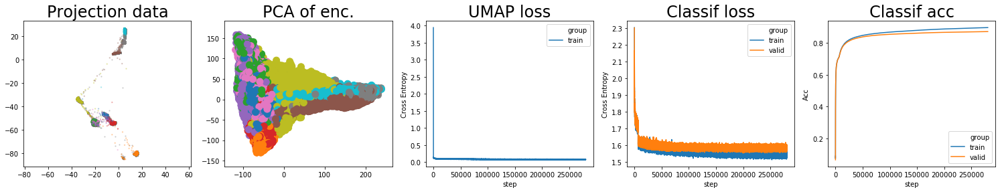

batch: 280000 | train acc: 0.8962 | val acc: 0.8711
tf.Tensor(0.8710961, shape=(), dtype=float32) 0.8609803819656372
saving weights


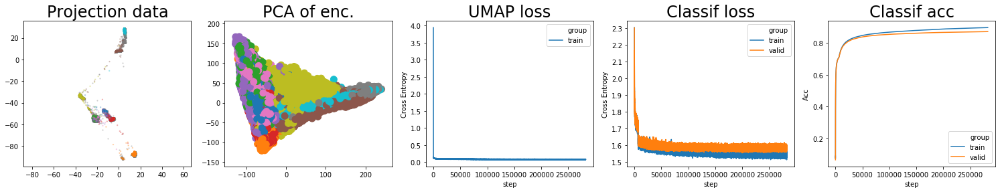

batch: 282500 | train acc: 0.8964 | val acc: 0.8712
tf.Tensor(0.8712147, shape=(), dtype=float32) 0.8610960745811462
saving weights


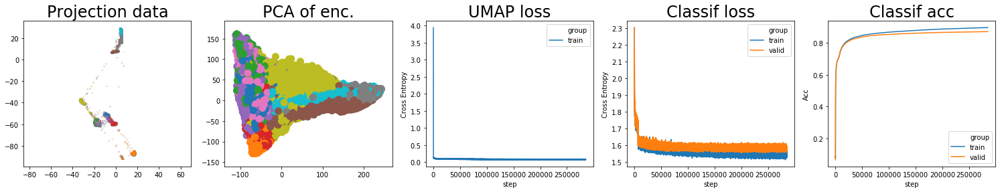

batch: 285000 | train acc: 0.8966 | val acc: 0.8713
tf.Tensor(0.87133247, shape=(), dtype=float32) 0.8612146878242493
saving weights


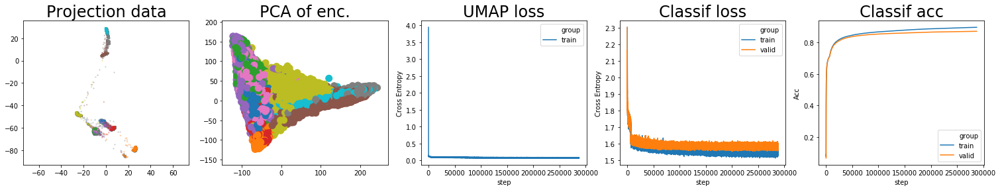

batch: 287500 | train acc: 0.8968 | val acc: 0.8714
tf.Tensor(0.8714408, shape=(), dtype=float32) 0.8613324666023254
saving weights


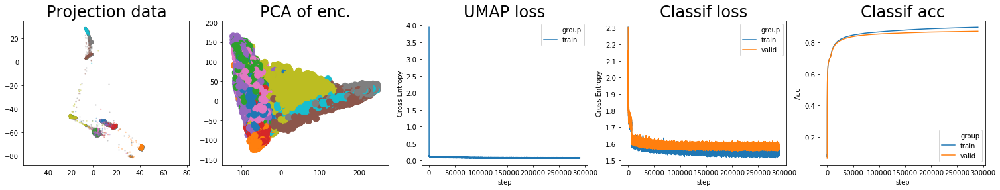

batch: 290000 | train acc: 0.897 | val acc: 0.8715
tf.Tensor(0.8715476, shape=(), dtype=float32) 0.8614408278465271
saving weights


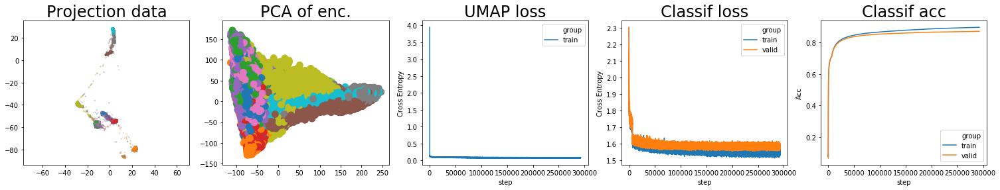

batch: 292500 | train acc: 0.8972 | val acc: 0.8716
tf.Tensor(0.8716453, shape=(), dtype=float32) 0.8615475797653198
saving weights


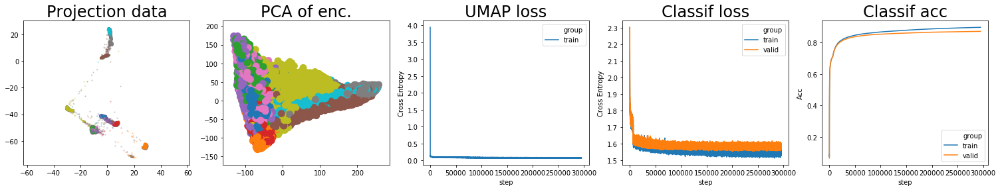

batch: 295000 | train acc: 0.8974 | val acc: 0.8717
tf.Tensor(0.8717465, shape=(), dtype=float32) 0.8616452717781067
saving weights


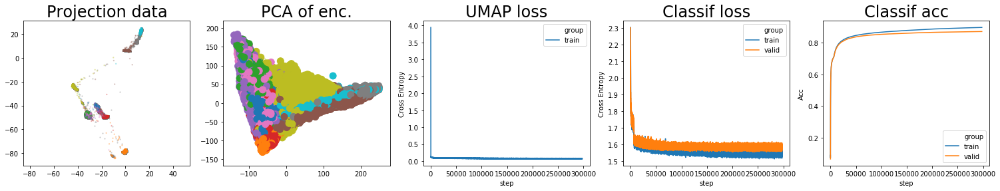

batch: 297500 | train acc: 0.8976 | val acc: 0.8718
tf.Tensor(0.8718437, shape=(), dtype=float32) 0.8617464804649353
saving weights


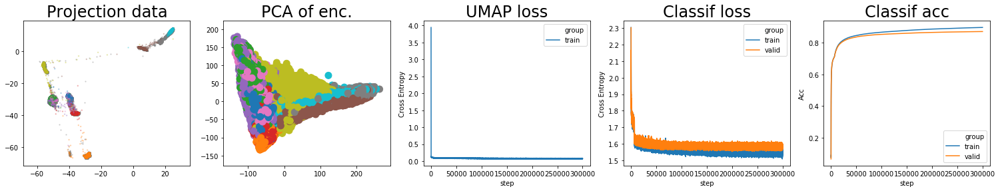

batch: 300000 | train acc: 0.8978 | val acc: 0.8719
tf.Tensor(0.8719353, shape=(), dtype=float32) 0.861843695640564
saving weights


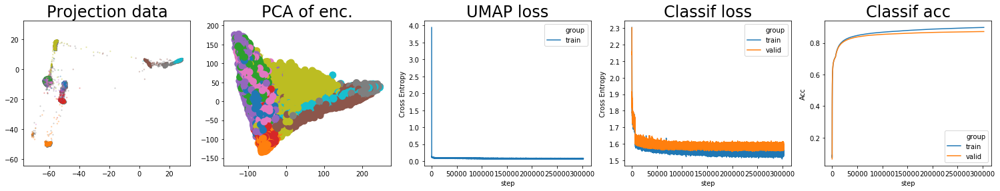

batch: 302500 | train acc: 0.898 | val acc: 0.872
tf.Tensor(0.872021, shape=(), dtype=float32) 0.8619353079795837
saving weights


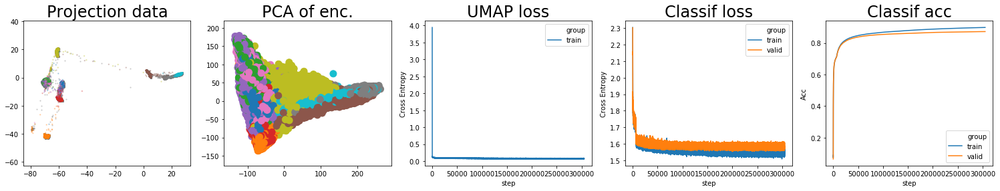

batch: 305000 | train acc: 0.8982 | val acc: 0.8721
tf.Tensor(0.87210405, shape=(), dtype=float32) 0.8620210194587707
saving weights


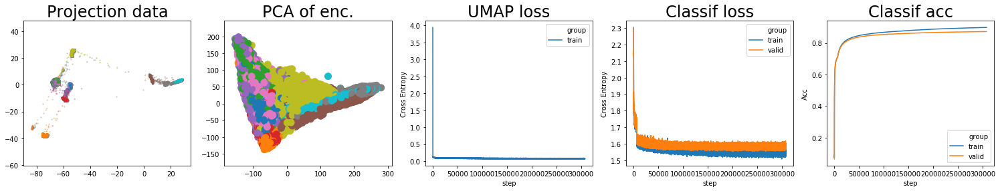

batch: 307500 | train acc: 0.8984 | val acc: 0.8722
tf.Tensor(0.87218904, shape=(), dtype=float32) 0.8621040487289429
saving weights


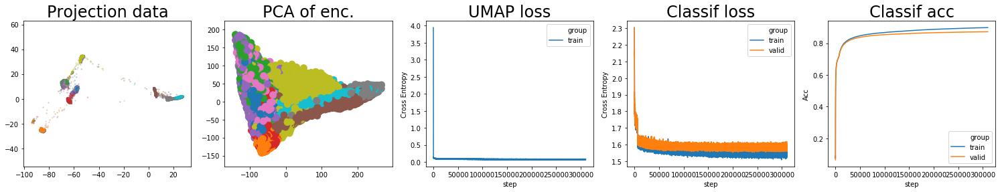

batch: 310000 | train acc: 0.8986 | val acc: 0.8723
tf.Tensor(0.8722586, shape=(), dtype=float32) 0.8621890449523926
saving weights


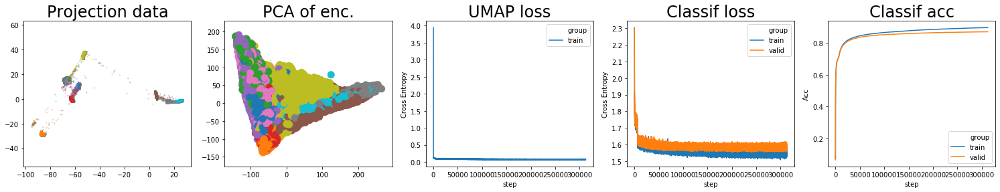

batch: 312500 | train acc: 0.8988 | val acc: 0.8723
tf.Tensor(0.87232083, shape=(), dtype=float32) 0.8622586035728455
saving weights


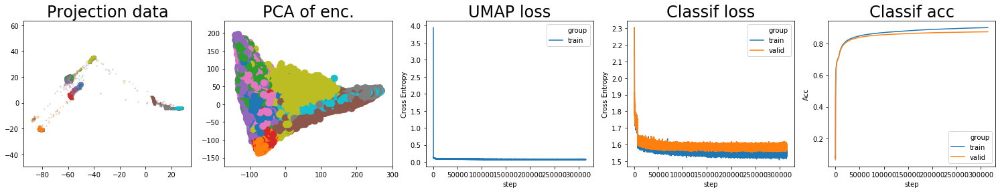

batch: 315000 | train acc: 0.8989 | val acc: 0.8724
tf.Tensor(0.8723824, shape=(), dtype=float32) 0.862320830821991
saving weights


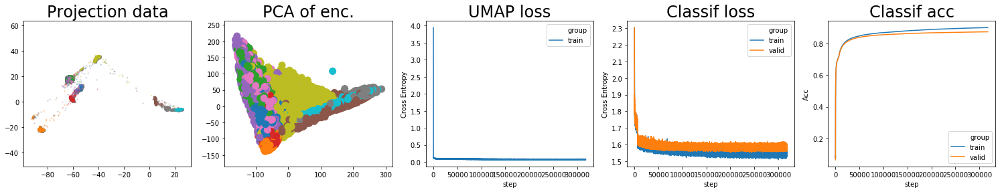

batch: 317500 | train acc: 0.8991 | val acc: 0.8724
tf.Tensor(0.8724439, shape=(), dtype=float32) 0.8623824024200439
saving weights


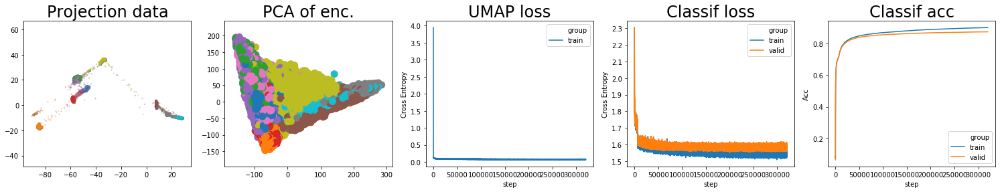

batch: 320000 | train acc: 0.8993 | val acc: 0.8725
tf.Tensor(0.87250686, shape=(), dtype=float32) 0.8624439144134521
saving weights


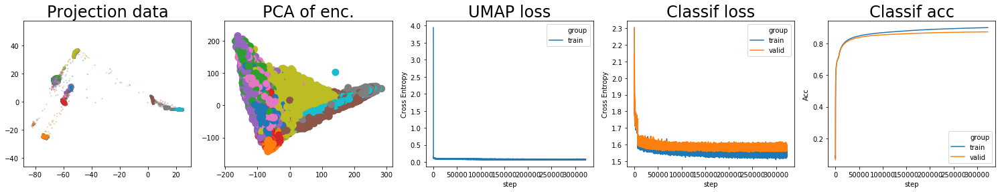

batch: 322500 | train acc: 0.8995 | val acc: 0.8726
tf.Tensor(0.8725684, shape=(), dtype=float32) 0.862506856918335
saving weights


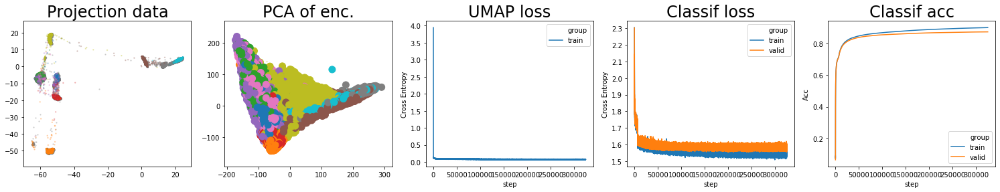

batch: 325000 | train acc: 0.8996 | val acc: 0.8726
tf.Tensor(0.872623, shape=(), dtype=float32) 0.8625684285163879
saving weights


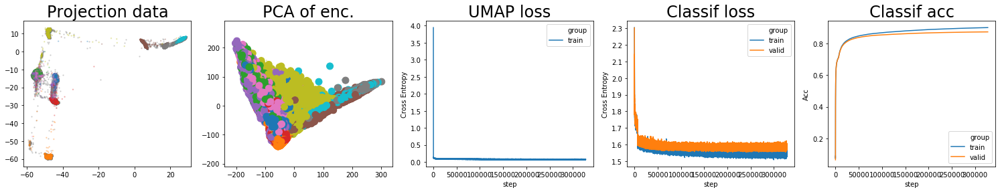

batch: 327500 | train acc: 0.8998 | val acc: 0.8727
tf.Tensor(0.8726837, shape=(), dtype=float32) 0.8626230263710022
saving weights


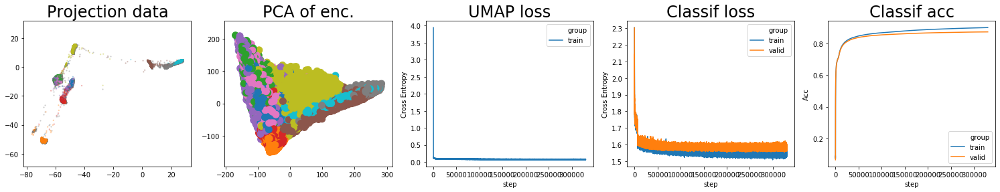

batch: 330000 | train acc: 0.9 | val acc: 0.8727
tf.Tensor(0.87274116, shape=(), dtype=float32) 0.8626837038993835
saving weights


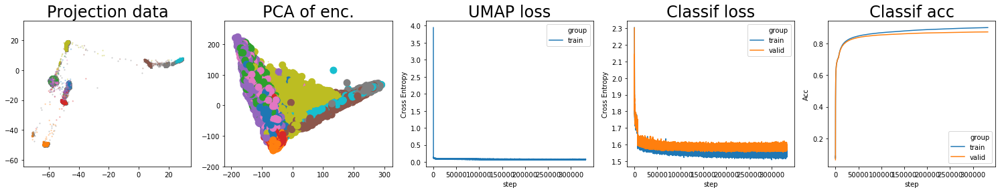

batch: 332500 | train acc: 0.9002 | val acc: 0.8728
tf.Tensor(0.87279606, shape=(), dtype=float32) 0.862741162776947
saving weights


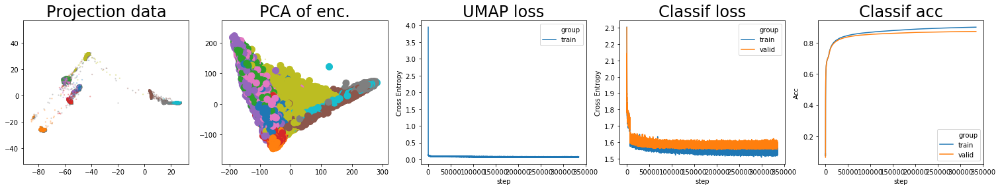

batch: 335000 | train acc: 0.9003 | val acc: 0.8728
tf.Tensor(0.872849, shape=(), dtype=float32) 0.8627960586547851
saving weights


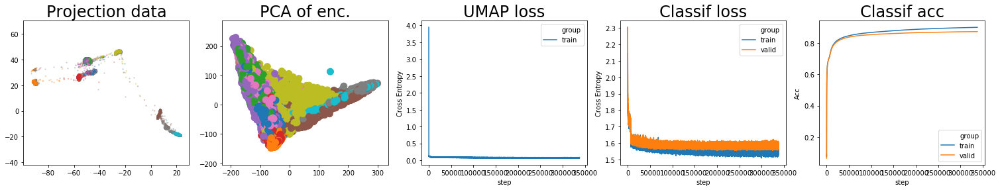

batch: 337500 | train acc: 0.9005 | val acc: 0.8729
tf.Tensor(0.87289995, shape=(), dtype=float32) 0.8628489875793457
saving weights


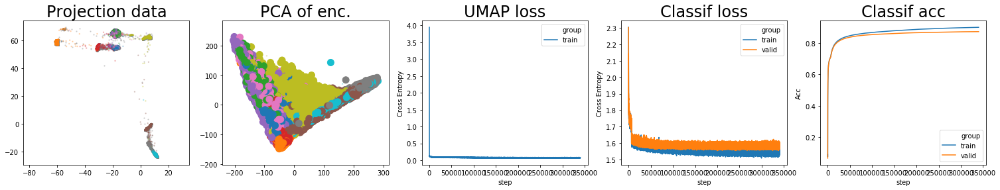

batch: 340000 | train acc: 0.9006 | val acc: 0.8729
tf.Tensor(0.872947, shape=(), dtype=float32) 0.8628999495506287
saving weights


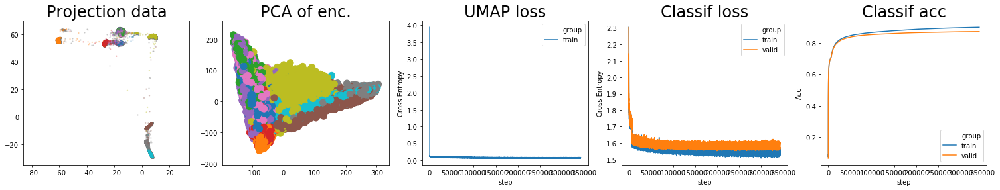

batch: 342500 | train acc: 0.9008 | val acc: 0.873
tf.Tensor(0.8729965, shape=(), dtype=float32) 0.8629469776153564
saving weights


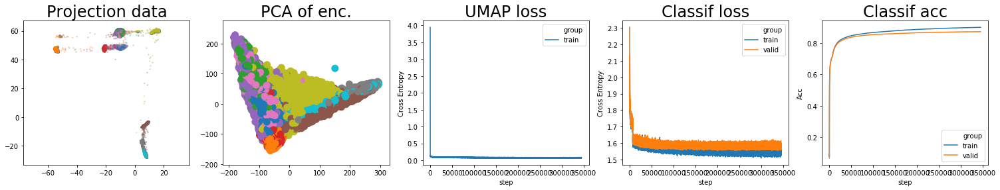

batch: 345000 | train acc: 0.901 | val acc: 0.8731
tf.Tensor(0.8730508, shape=(), dtype=float32) 0.8629965090751648
saving weights


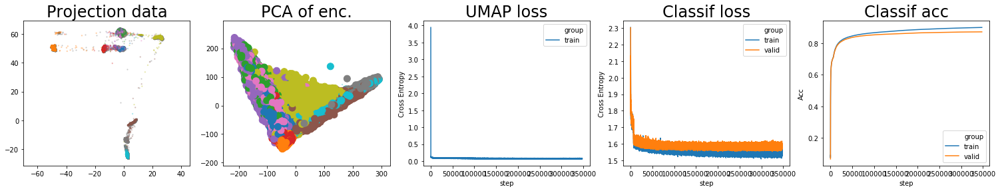

batch: 347500 | train acc: 0.9011 | val acc: 0.8731
tf.Tensor(0.87309635, shape=(), dtype=float32) 0.8630508089065552
saving weights


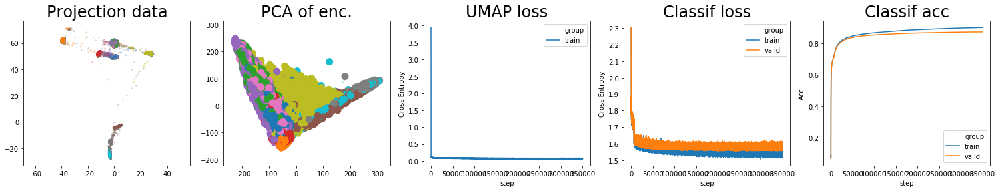

batch: 350000 | train acc: 0.9013 | val acc: 0.8731
tf.Tensor(0.87314934, shape=(), dtype=float32) 0.8630963468551636
saving weights


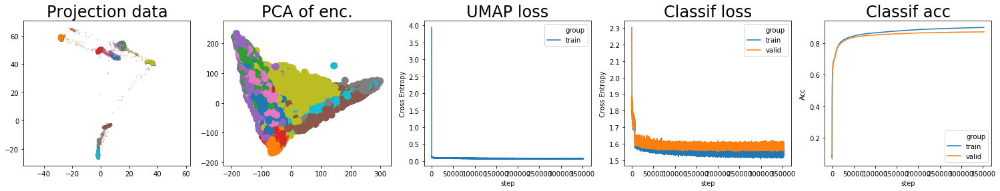

batch: 352500 | train acc: 0.9014 | val acc: 0.8732
tf.Tensor(0.8731999, shape=(), dtype=float32) 0.8631493353843689
saving weights


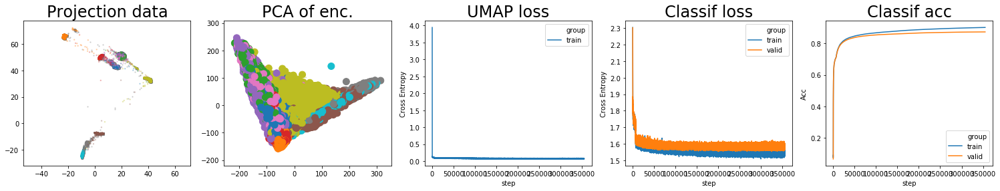

batch: 355000 | train acc: 0.9016 | val acc: 0.8732
tf.Tensor(0.87325, shape=(), dtype=float32) 0.8631998801231384
saving weights


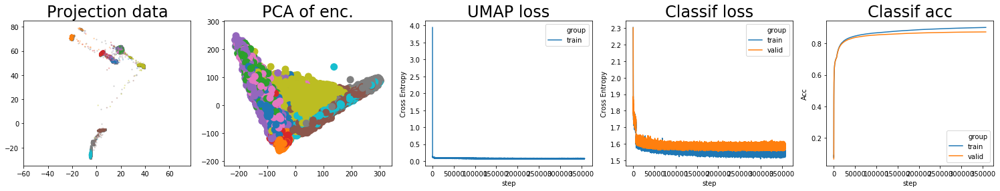

batch: 357500 | train acc: 0.9018 | val acc: 0.8733
tf.Tensor(0.87330234, shape=(), dtype=float32) 0.8632500076293945
saving weights


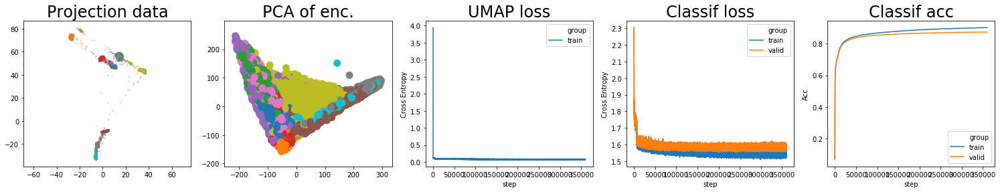

batch: 360000 | train acc: 0.9019 | val acc: 0.8733
tf.Tensor(0.873346, shape=(), dtype=float32) 0.8633023405075073
saving weights


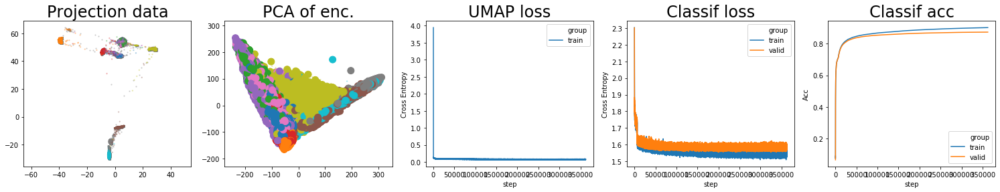

batch: 362500 | train acc: 0.9021 | val acc: 0.8734
tf.Tensor(0.87338525, shape=(), dtype=float32) 0.8633459711074829
saving weights


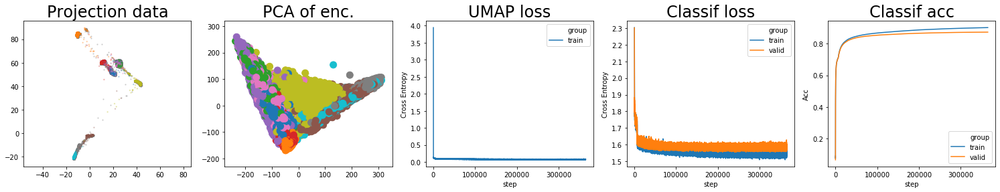

batch: 365000 | train acc: 0.9022 | val acc: 0.8734
tf.Tensor(0.87342036, shape=(), dtype=float32) 0.8633852505683899
saving weights


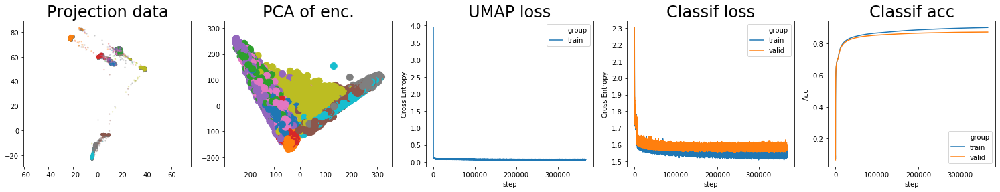

batch: 367500 | train acc: 0.9023 | val acc: 0.8735
tf.Tensor(0.87346566, shape=(), dtype=float32) 0.8634203577041626
saving weights


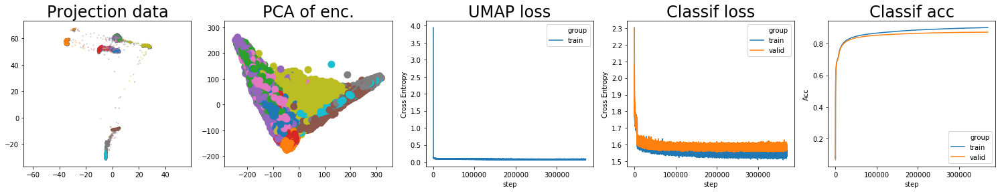

batch: 370000 | train acc: 0.9025 | val acc: 0.8735
tf.Tensor(0.87350607, shape=(), dtype=float32) 0.8634656572341919
saving weights


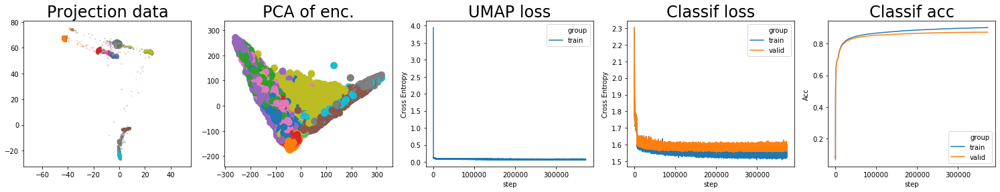

batch: 372500 | train acc: 0.9026 | val acc: 0.8735
tf.Tensor(0.8735489, shape=(), dtype=float32) 0.8635060691833496
saving weights


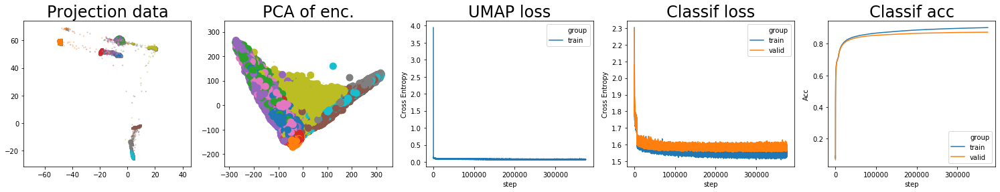

batch: 375000 | train acc: 0.9027 | val acc: 0.8736
tf.Tensor(0.8735947, shape=(), dtype=float32) 0.8635489249229431
saving weights


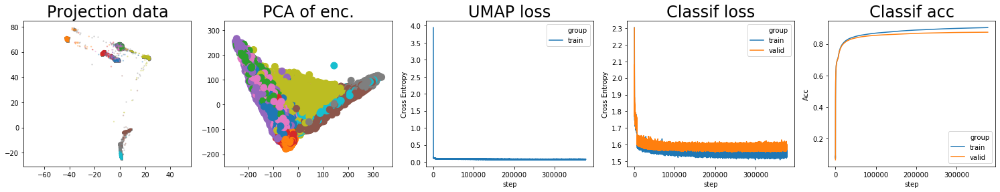

batch: 377500 | train acc: 0.9029 | val acc: 0.8736
tf.Tensor(0.87364227, shape=(), dtype=float32) 0.8635947012901306
saving weights


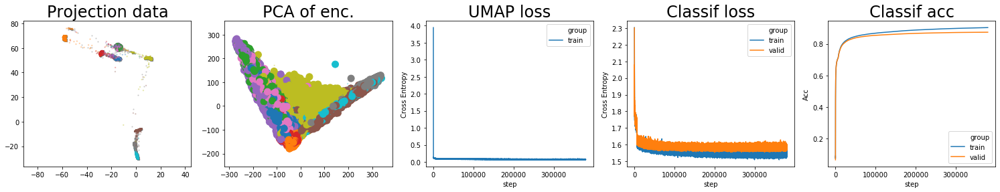

batch: 380000 | train acc: 0.903 | val acc: 0.8737
tf.Tensor(0.87368846, shape=(), dtype=float32) 0.8636422657966614
saving weights


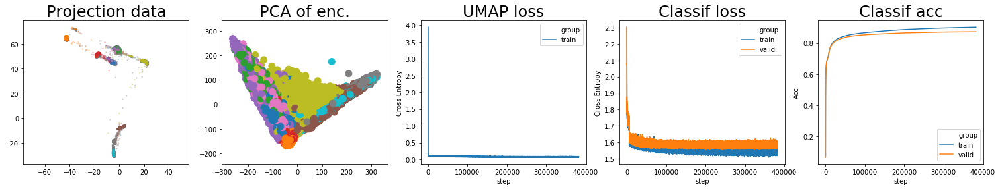

batch: 382500 | train acc: 0.9031 | val acc: 0.8737
tf.Tensor(0.8737277, shape=(), dtype=float32) 0.8636884593963623
saving weights


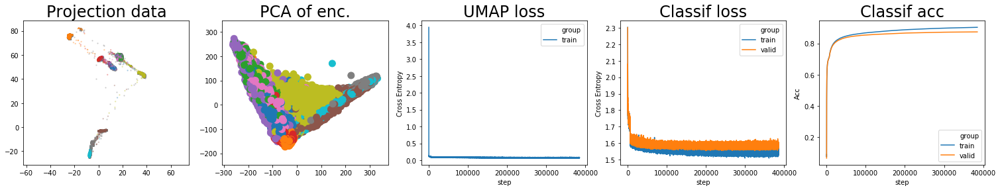

batch: 385000 | train acc: 0.9033 | val acc: 0.8738
tf.Tensor(0.87376577, shape=(), dtype=float32) 0.8637276792526245
saving weights


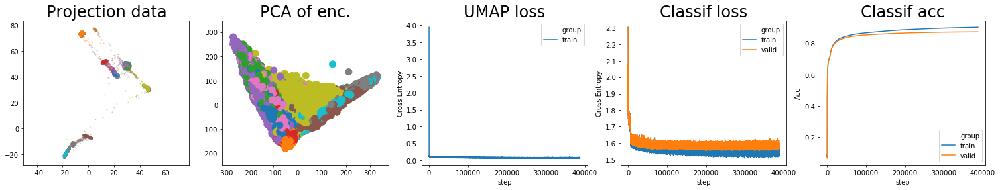

batch: 387500 | train acc: 0.9034 | val acc: 0.8738
tf.Tensor(0.8737972, shape=(), dtype=float32) 0.863765766620636
saving weights


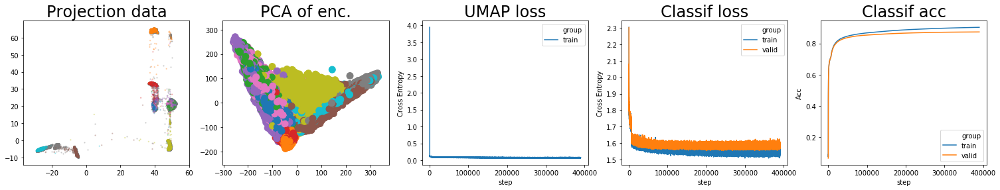

batch: 390000 | train acc: 0.9035 | val acc: 0.8738
tf.Tensor(0.87382704, shape=(), dtype=float32) 0.8637971782684326
saving weights


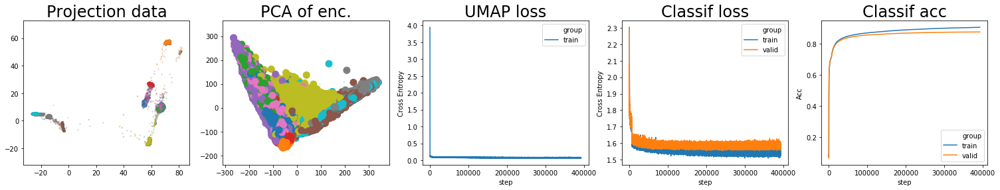

batch: 392500 | train acc: 0.9036 | val acc: 0.8739
tf.Tensor(0.8738649, shape=(), dtype=float32) 0.8638270401954651
saving weights


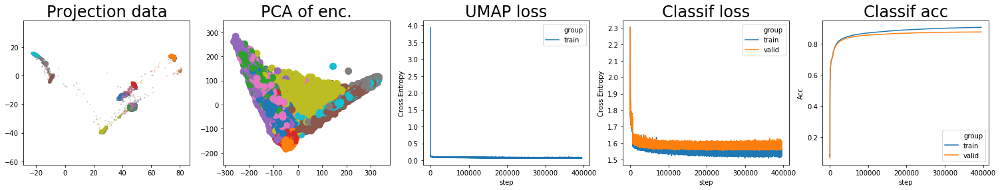

batch: 395000 | train acc: 0.9038 | val acc: 0.8739
tf.Tensor(0.87390155, shape=(), dtype=float32) 0.8638648891448975
saving weights


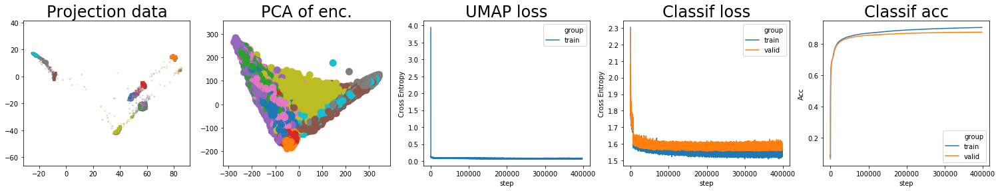

batch: 397500 | train acc: 0.9039 | val acc: 0.8739
tf.Tensor(0.87393445, shape=(), dtype=float32) 0.8639015460014343
saving weights


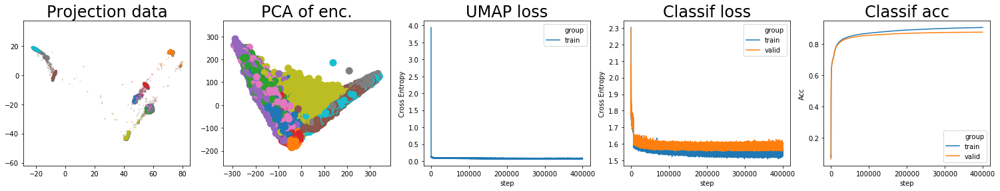

batch: 400000 | train acc: 0.904 | val acc: 0.874
tf.Tensor(0.87396884, shape=(), dtype=float32) 0.8639344477653503
saving weights


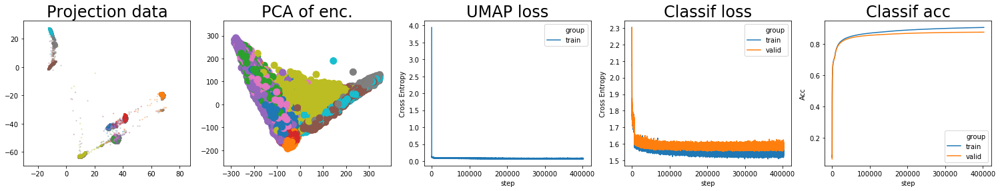

batch: 402500 | train acc: 0.9041 | val acc: 0.874
tf.Tensor(0.87400013, shape=(), dtype=float32) 0.8639688396453857
saving weights


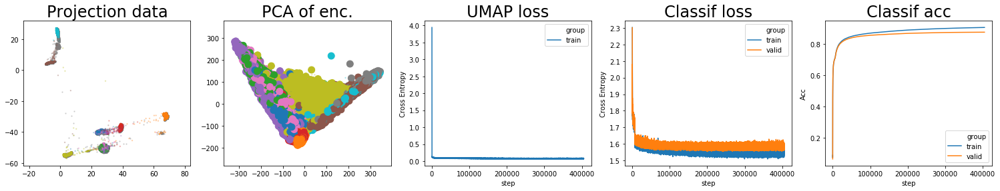

batch: 405000 | train acc: 0.9042 | val acc: 0.874
tf.Tensor(0.8740388, shape=(), dtype=float32) 0.8640001320838928
saving weights


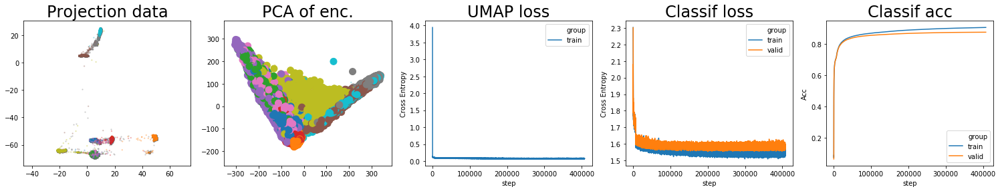

batch: 407500 | train acc: 0.9043 | val acc: 0.8741
tf.Tensor(0.874075, shape=(), dtype=float32) 0.864038815498352
saving weights


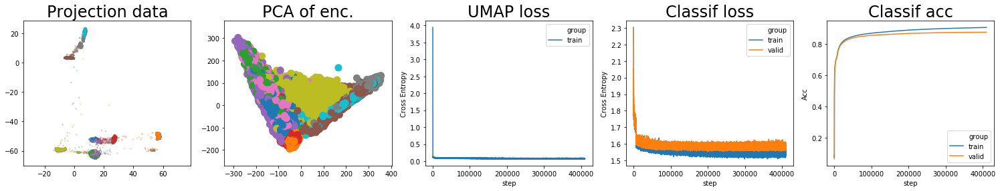

batch: 410000 | train acc: 0.9045 | val acc: 0.8741
tf.Tensor(0.8741146, shape=(), dtype=float32) 0.8640749955177307
saving weights


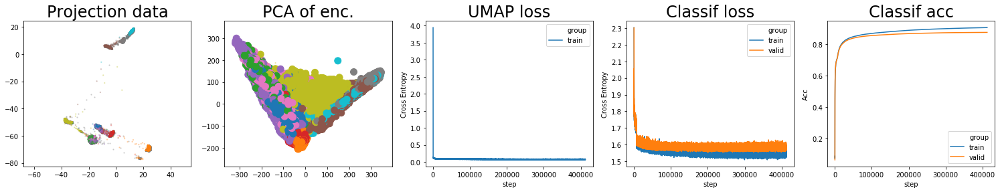

batch: 412500 | train acc: 0.9046 | val acc: 0.8742
tf.Tensor(0.87415177, shape=(), dtype=float32) 0.8641145730018616
saving weights


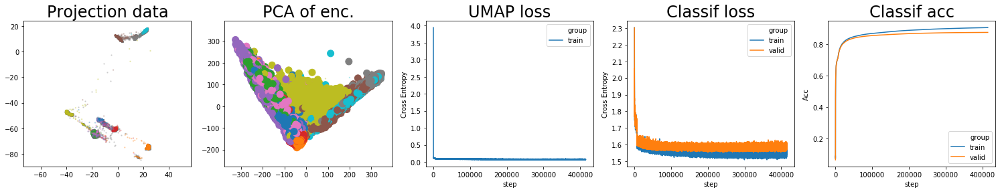

batch: 415000 | train acc: 0.9047 | val acc: 0.8742
tf.Tensor(0.87418133, shape=(), dtype=float32) 0.8641517663002014
saving weights


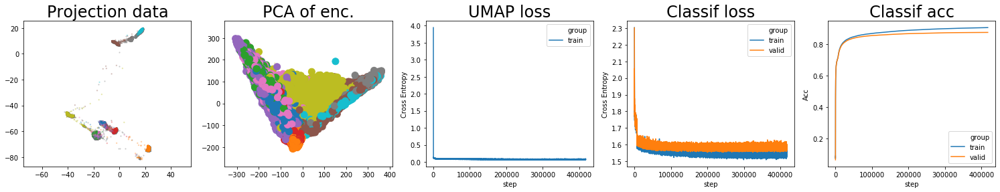

batch: 417500 | train acc: 0.9048 | val acc: 0.8742
tf.Tensor(0.874209, shape=(), dtype=float32) 0.86418133020401
saving weights


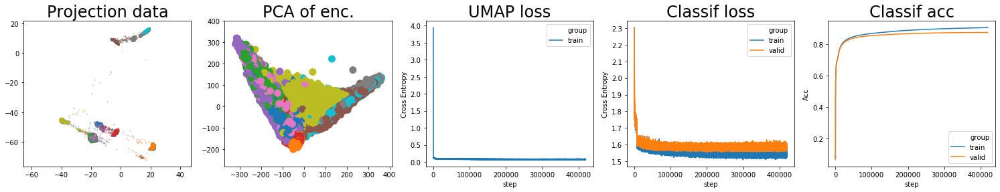

batch: 420000 | train acc: 0.9049 | val acc: 0.8742
tf.Tensor(0.87423694, shape=(), dtype=float32) 0.8642089867591858
saving weights


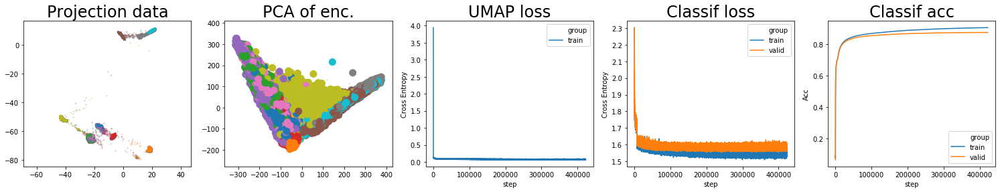

batch: 422500 | train acc: 0.905 | val acc: 0.8743
tf.Tensor(0.874268, shape=(), dtype=float32) 0.8642369413375854
saving weights


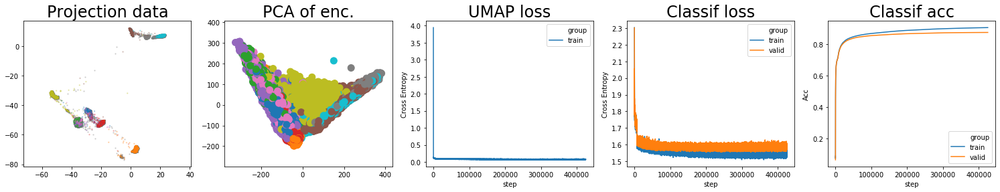

batch: 425000 | train acc: 0.9051 | val acc: 0.8743
tf.Tensor(0.8742945, shape=(), dtype=float32) 0.8642679953575134
saving weights


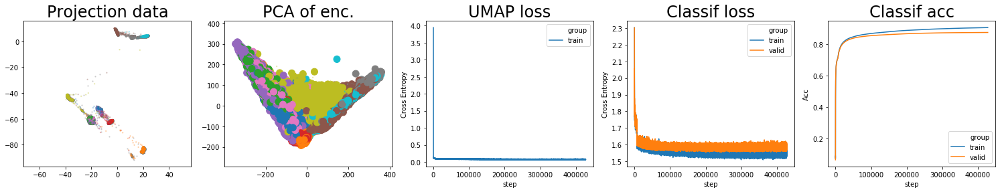

batch: 427500 | train acc: 0.9052 | val acc: 0.8743
tf.Tensor(0.87431234, shape=(), dtype=float32) 0.8642945194244385
saving weights


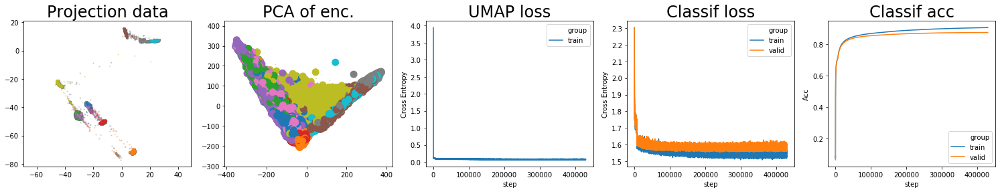

batch: 430000 | train acc: 0.9053 | val acc: 0.8743
tf.Tensor(0.87433666, shape=(), dtype=float32) 0.8643123412132263
saving weights


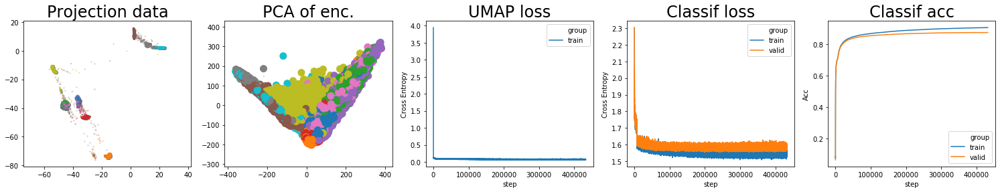

batch: 432500 | train acc: 0.9054 | val acc: 0.8744
tf.Tensor(0.87435824, shape=(), dtype=float32) 0.8643366599082947
saving weights
Early stopping


In [31]:
for edge_epoch, epoch in tqdm(zip(edge_iter, np.arange(N_EPOCHS)), total=N_EPOCHS):
    for (batch_to, batch_from), (X, y), (X_val, y_val) in tqdm(
        zip(edge_epoch, labeled_iter, data_valid), total=BATCHES_PER_EPOCH, leave=False
    ):

        # train
        (
            attraction_loss,
            repellant_loss,
            umap_loss,
            classifier_loss,
            classifier_acc,
        ) = model.train(
            batch_to=X_train[batch_to], batch_from=X_train[batch_from], X=X, y=y
        )

        # compute validation loss
        val_loss, val_acc = compute_classifier_loss(
            X_val,
            y_val,
            model.encoder,
            model.classifier,
            model.sparse_ce,
            model.class_acc_val,
        )

        # save losses
        model.write_losses(
            tf.convert_to_tensor(batch, dtype=tf.int64),
            classifier_acc,
            classifier_loss,
            umap_loss,
            val_loss,
            val_acc,
        )
        
        # plot results
        if batch % plot_frequency == 0:
            plot_umap_classif_results(
                model,
                X_valid,
                Y_valid,
                X_train,
                X_labeled,
                Y_labeled,
                batch_size,
                cmap="tab10",
                cmap2="tab10",
            )
            print(
                "batch: {} | train acc: {} | val acc: {}".format(
                    str(batch),
                    str(round(classifier_acc.numpy(), 4)),
                    str(round(val_acc.numpy(), 4)),
                )
            )
        
        #### save network
        if batch % save_frequency == 0:
            print(val_acc , (best_saved_acc - max_reinitialize_delta))
            if val_acc > best_saved_acc:
                # save weights
                print('saving weights')
                model.encoder.save_weights((cpt_path / 'encoder').as_posix())
                model.embedder.save_weights((cpt_path / 'embedder').as_posix())
                model.classifier.save_weights((cpt_path /  'classifier').as_posix())
                best_saved_acc = val_acc.numpy()
                # save batch number
                best_saved_batch = copy.deepcopy(batch)
            
            elif val_acc < (best_saved_acc - max_reinitialize_delta):
                # reload weights
                print('reloading weights')
                model.encoder.load_weights((cpt_path /  'encoder').as_posix())
                model.embedder.load_weights((cpt_path /  'embedder').as_posix())
                model.classifier.load_weights((cpt_path /  'classifier').as_posix())
                
                # reset batch
                batch = copy.deepcopy(best_saved_batch)
                # reset optimizer
                for var in model.optimizer.variables():
                    var.assign(tf.zeros_like(var))
                    
                # continue on with newly updated batch (past early stopping)
                continue
        
        #### early stopping
        # if there is an imporovement, set new best score
        if val_acc > best_acc + min_delta:
            last_improvement = 0
            best_acc = val_acc
        else:
            # if model has not improved and patience has been surpassed, quit
            if last_improvement>= patience:
                print('Early stopping')
                early_stopping = True
                break
            else:
                last_improvement+=1
            
        batch += 1
    if early_stopping:
        break

In [32]:
from tfumap.umap import retrieve_tensors
import seaborn as sns

from tfumap.semisupervised_plotting import embed_data

loss_df = retrieve_tensors(model.tensorboard_logdir)
loss_df['step'] +=1
loss_df

,wall_time,step,val,group,variable
0,1.596057e+09,1,0.089000,train,classif_acc
1,1.596057e+09,2,0.075000,train,classif_acc
2,1.596057e+09,3,0.073000,train,classif_acc
3,1.596057e+09,4,0.103750,train,classif_acc
4,1.596057e+09,5,0.126200,train,classif_acc
...,...,...,...,...,...
434204,1.596083e+09,434205,1.599061,valid,classif_loss
434205,1.596083e+09,434206,1.583134,valid,classif_loss
434206,1.596083e+09,434207,1.595948,valid,classif_loss
434207,1.596083e+09,434208,1.600210,valid,classif_loss


In [33]:
loss_df.to_pickle(cpt_path/'loss_df')

In [34]:
valid_acc = loss_df[
    (loss_df.group.values == "valid") & (loss_df.variable.values == "classif_acc")
].val.values

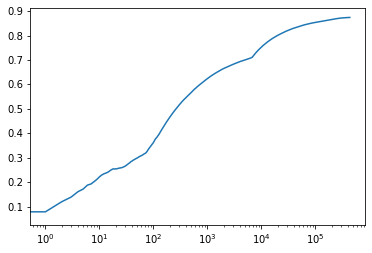

In [35]:
plt.semilogx(valid_acc)

In [36]:
# inspect memory footprint

In [37]:
import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ["In", "Out", "exit", "quit", "get_ipython", "ipython_vars"]

# Get a sorted list of the objects and their sizes
sorted(
    [
        (x, sys.getsizeof(globals().get(x)))
        for x in dir()
        if not x.startswith("_") and x not in sys.modules and x not in ipython_vars
    ],
    key=lambda x: x[1],
    reverse=True,
)

[('loss_df', 403814394),
 ('epochs_per_sample', 7069152),
 ('head', 3534624),
 ('tail', 3534624),
 ('weight', 3534624),
 ('Y_masked', 400096),
 ('Y_masked2', 50096),
 ('PUMAP', 888),
 ('X', 168),
 ('X_val', 168),
 ('attraction_loss', 168),
 ('batch_from', 168),
 ('batch_to', 168),
 ('best_acc', 168),
 ('classifier_acc', 168),
 ('classifier_loss', 168),
 ('repellant_loss', 168),
 ('umap_loss', 168),
 ('val_acc', 168),
 ('val_loss', 168),
 ('y', 168),
 ('y_val', 168),
 ('X_labeled', 144),
 ('X_test', 144),
 ('X_train', 144),
 ('X_valid', 144),
 ('black_reformat', 136),
 ('build_fuzzy_simplicial_set', 136),
 ('compute_cross_entropy', 136),
 ('create_classification_iterator', 136),
 ('create_edge_iterator', 136),
 ('create_validation_iterator', 136),
 ('embed_data', 136),
 ('get_decision_contour', 136),
 ('get_graph_elements', 136),
 ('load_FMNIST', 136),
 ('mask_labels', 136),
 ('plot_results', 136),
 ('plot_umap_classif_results', 136),
 ('retrieve_tensors', 136),
 ('yapf_reformat', 136),